<a href="https://colab.research.google.com/github/Simranjeet-Singh-1313/Detection_-_Recognition_of_Traffic_signs/blob/main/Detection_%26_Recognition_of_Traffic_signs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Detection & Recognition of Traffic Signs

Detection and recognition of traffic signs is an important task for autonomous driving. 

The task is to identify traffic signs in images and recognise them. 

Dataset available at [German Traffic Sign Recognition Benchmark (GTSRB)](https://sid.erda.dk/public/archives/daaeac0d7ce1152aea9b61d9f1e19370/published-archive.html).

## Setup

### Import

In [1]:
import os
import tensorflow as tf
import sklearn as sk
import pandas as pd
import numpy as np
from matplotlib import pyplot
import matplotlib.pyplot as plt
from tensorflow import keras
import seaborn as sns
import random
from matplotlib.image import imread

### Download

Download German Traffic Sign Recognition Benchmark (GTSRB) training images, with `tf.keras.utils.get_file` method.



In [2]:
training_images_zip = tf.keras.utils.get_file(
    fname='training_images.zip',
    origin='https://sid.erda.dk/public/archives/daaeac0d7ce1152aea9b61d9f1e19370/GTSRB_Final_Training_Images.zip',
    extract=True,
    archive_format='zip'
)

276307968/276294756 [==============================] - 12s 0us/step


In [3]:
!ls -al /root/.keras/datasets

total 269832
drwxr-xr-x 3 root root      4096 Apr 20 12:02 .
drwxr-xr-x 3 root root      4096 Apr 20 12:02 ..
drwxr-xr-x 3 root root      4096 Apr 20 12:02 GTSRB
-rw-r--r-- 1 root root 276294756 Apr 20 12:02 training_images.zip


Training images (unzipped directory).

In [4]:
training_images_dir = '/root/.keras/datasets/GTSRB/Final_Training/Images'

Download German Traffic Sign Recognition Benchmark (GTSRB) test images, with `tf.keras.utils.get_file` method.

In [5]:
test_images_zip = tf.keras.utils.get_file(
    fname='test_images.zip',
    origin='https://sid.erda.dk/public/archives/daaeac0d7ce1152aea9b61d9f1e19370/GTSRB_Final_Test_Images.zip',
    extract=True,
    archive_format='zip'
)

88989696/88978620 [==============================] - 6s 0us/step


Test images (unzipped directory).

In [6]:
test_images_dir = '/root/.keras/datasets/GTSRB/Final_Test/Images/'

Download German Traffic Sign Recognition Benchmark (GTSRB) test image annotations, with `tf.keras.utils.get_file` method.



In [7]:
test_images_csv_zip = tf.keras.utils.get_file(
    fname='test_images_csv.zip',
    origin='https://sid.erda.dk/public/archives/daaeac0d7ce1152aea9b61d9f1e19370/GTSRB_Final_Test_GT.zip',
    extract=True,
    archive_format='zip'
)

114688/99620 [==================================] - 0s 2us/step


Test image annotations (csv).

In [8]:
test_images_csv = '/root/.keras/datasets/GT-final_test.csv'

### Utils

Function to print a sample of a dataset.


In [9]:
def image_sample(dataset):
  plt.figure(figsize=(20, 10))

  for images, _ in dataset.take(1):
    for i, image in enumerate(images):
      plt.subplot(4, 8, (i + 1))
      plt.imshow(image.numpy()[:,:,0], cmap="gray")

Function to print sample of a dataset returned by function.



In [10]:
def image_sample_function(dataset, function):
  plt.figure(figsize=(20, 10))

  for images, _ in dataset.take(1):
    for i, image in enumerate(images):
      plt.subplot(4, 8, (i + 1))
      plt.imshow(function(image).numpy()[:,:,0], cmap="gray")

Function to print sample of dataset with prediction labels.


In [11]:
class_names = ['Speed limit (20km/h)','Speed limit (30km/h)', 'Speed limit (50km/h)','Speed limit (60km/h)','Speed limit (70km/h)','Speed limit (80km/h)','End of speed limit (80km/h)','Speed limit (100km/h)','Speed limit (120km/h)','No passing','No passing for vehicles over 3.5 t','Right-of-way at the next intersection','Priority road','Yield','Stop','No vehicles','Vehicles over 3.5 t prohibited','No entry','General caution','Dangerous curve to the left','Dangerous curve to the right','Double curve', 'Bumpy road','Slippery road','Road narrows on the right','Road work','Traffic signals','Pedestrians','Children crossing','Bicycles crossing','Beware of ice/snow','Wild animals crossing','End of all speed and passing limits','Turn right ahead','Turn left ahead','Ahead only','Go straight or right','Go straight or left','Keep right','Keep left','Roundabout mandatory','End of no passing','End of no passing by vehicles over 3.5 t']


def image_sample_prediction(dataset, model):
  plt.figure(figsize=(20, 20))

  for images, labels in dataset.take(1):
    for i, image in enumerate(images):
      plt.subplot(6, 6, (i + 1))
      prediction = model.predict(tf.expand_dims(image.numpy(), 0))[0]
      plt.imshow(image.numpy()[:,:,0], cmap="gray")
      plt.title(class_names[np.where(prediction == np.amax(prediction))[0][0]])

### Load (Metadata)

Load German Traffic Sign Recognition Benchmark (GTSRB) training image metadata, into pandas dataframe for data exploration.

In [12]:
training_images_metadata = pd.DataFrame(columns=['Filename','Width','Height','Roi.X1','Roi.Y1','Roi.X2','Roi.Y2','ClassId'])

for dirpath, _, filenames in os.walk(training_images_dir):
  for filename in filenames:
    if filename.endswith('.csv'):
      training_images_metadata = pd.concat((training_images_metadata, pd.read_csv(os.path.join(dirpath, filename), sep=';')))

Load German Traffic Sign Recognition Benchmark (GTSRB) test image metadata, into pandas dataframe for data exploration.

In [13]:
test_images_metadata = pd.read_csv(test_images_csv, sep=';')

### Load (Images)

Convert all images from `.ppm` to `.png` format, using the `PIL.Image.open` and `PIL.Image.save` methods.



In [14]:
from PIL import Image


def convert_ppm_to_png(directory):
  for dirpath, _, filenames in os.walk(directory):
    for filename in filenames:
      if filename.endswith('.ppm'):
        filename, _ = filename.split('.')
        image = Image.open(f'{dirpath}/{filename}.ppm')
        image.save(f'{dirpath}/{filename}.png')

In [15]:
convert_ppm_to_png(training_images_dir)

In [16]:
convert_ppm_to_png(test_images_dir)

Load training dataset, with `tf.keras.preprocessing.image_dataset_from_directory` method. 

In [17]:
training_dataset = tf.keras.preprocessing.image_dataset_from_directory(
  training_images_dir,
  color_mode='grayscale',
  image_size=(128, 128),
  shuffle=True,
  seed=18,
  validation_split=0.2,
  subset='training'
)

Found 39209 files belonging to 43 classes.
Using 31368 files for training.


In [18]:
training_dataset = training_dataset.prefetch(buffer_size=32)

Print sample of dataset.

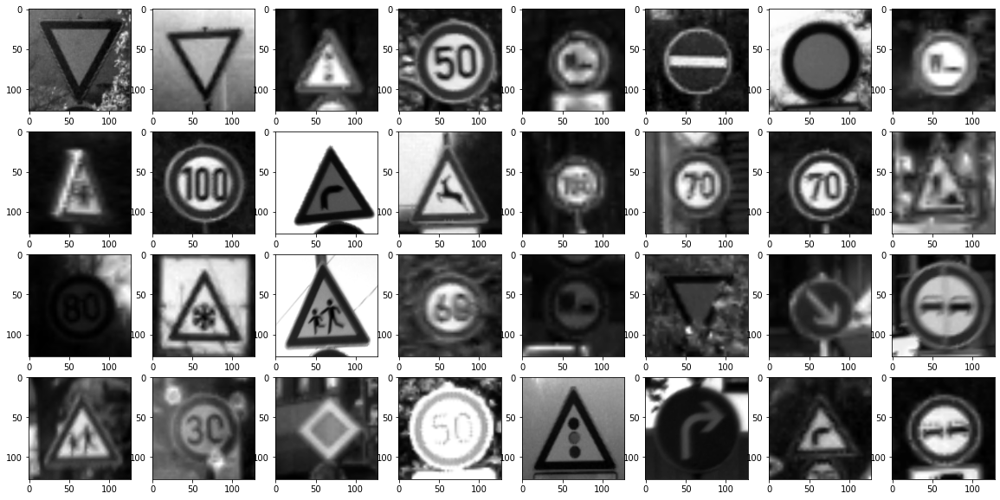

In [19]:
image_sample(training_dataset)

Load validation dataset, with `tf.keras.preprocessing.image_dataset_from_directory` method.


In [20]:
validation_dataset = tf.keras.preprocessing.image_dataset_from_directory(
  training_images_dir,
  color_mode='grayscale',
  image_size=(128, 128),
  shuffle=True,
  seed=18,
  validation_split=0.2,
  subset='validation'
)

Found 39209 files belonging to 43 classes.
Using 7841 files for validation.


In [21]:
validation_dataset = validation_dataset.prefetch(buffer_size=32)

Print sample of dataset.

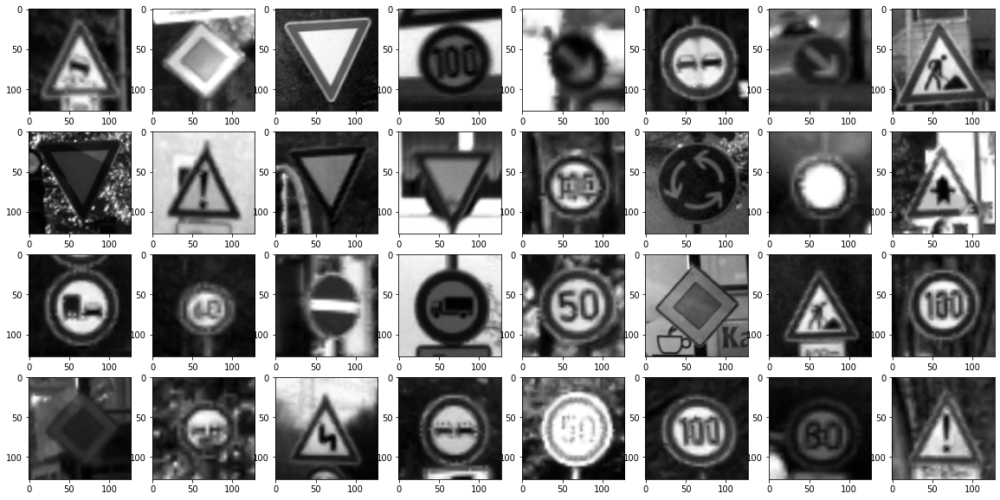

In [22]:
image_sample(validation_dataset)

Restructure test images directory into folders per class.

In [23]:
def restructure_directory(directory, metadata):
  for dirpath, _, filenames in os.walk(directory):
    for filename in filenames:
      if filename.endswith('.ppm'):
        filename, _ = filename.split('.')

        id = int(metadata.loc[metadata.Filename == f'{filename}.ppm'].ClassId)
        directory = f'{dirpath}{id:05}'

        if not os.path.isdir(directory): os.mkdir(directory)
        
        os.rename(f'{dirpath}{filename}.png', f'{directory}/{filename}.png')

In [24]:
restructure_directory(test_images_dir, test_images_metadata)

Load test dataset, with `tf.keras.preprocessing.image_dataset_from_directory` method.


In [25]:
test_dataset = tf.keras.preprocessing.image_dataset_from_directory(
  test_images_dir,
  color_mode='grayscale',
  image_size=(128, 128),
  shuffle=True
)

Found 12630 files belonging to 43 classes.


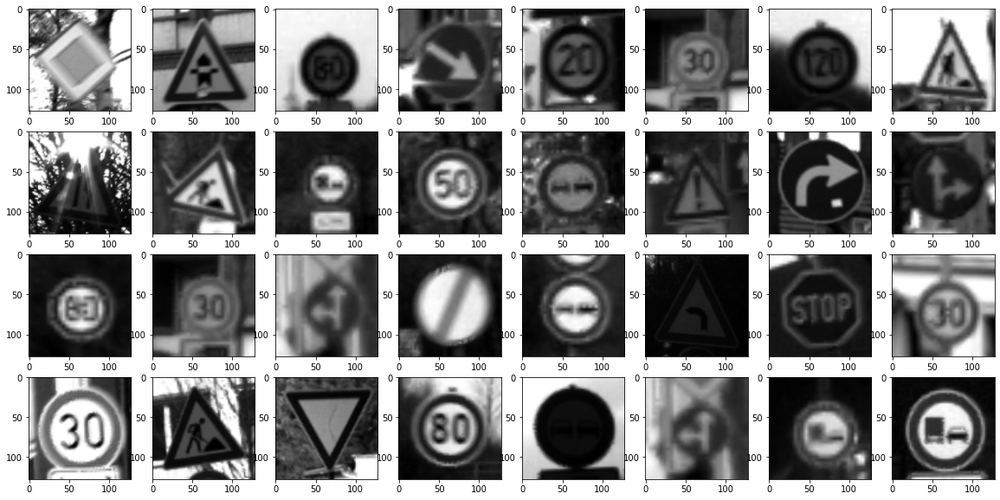

In [26]:
image_sample(test_dataset)

## Data Exploration 

### Training Images

Print `head()` of `training_images_metadata`.

In [27]:
training_images_metadata.head()

,Filename,Width,Height,Roi.X1,Roi.Y1,Roi.X2,Roi.Y2,ClassId
0,00000_00000.ppm,29,30,5,6,24,25,5
1,00000_00001.ppm,30,32,5,6,25,27,5
2,00000_00002.ppm,31,31,5,5,26,26,5
3,00000_00003.ppm,32,32,6,5,27,27,5
4,00000_00004.ppm,31,32,5,5,26,27,5


In [28]:
training_images_metadata.Width.min(), training_images_metadata.Width.max(), training_images_metadata.Width.mean()

(25, 243, 50.83587951745773)

In [29]:
training_images_metadata.Height.min(), training_images_metadata.Height.max(), training_images_metadata.Height.mean()

(25, 225, 50.328929582493814)

In [30]:
training_images_metadata.ClassId.mode()

0    2
dtype: object

In [31]:
training_images_metadata['ClassId'].value_counts()



2     2250
1     2220
13    2160
12    2100
38    2070
10    2010
4     1980
5     1860
25    1500
9     1470
7     1440
8     1410
3     1410
11    1320
35    1200
18    1200
17    1110
14     780
31     780
33     689
15     630
26     600
28     540
23     510
30     450
34     420
16     420
6      420
22     390
36     390
20     360
40     360
21     330
39     300
29     270
24     270
27     240
42     240
32     240
41     240
0      210
19     210
37     210
Name: ClassId, dtype: int64

In [32]:
training_images_metadata.ClassId.min(), training_images_metadata.ClassId.max()

(0, 42)

In [33]:
training_images_metadata.shape

(39209, 8)

In [34]:
training_images_metadata.describe()

,Filename,Width,Height,Roi.X1,Roi.Y1,Roi.X2,Roi.Y2,ClassId
count,39209,39209,39209,39209,39209,39209,39209,39209
unique,2250,187,176,20,16,177,168,43
top,00000_00000.ppm,34,33,6,6,29,28,2
freq,43,1327,1380,17364,17464,1341,1402,2250


Histogram of classes from training data

In [35]:
Total_classes = len(os.listdir(training_images_dir))
df_training = training_images_metadata
df_test = test_images_metadata

df_training['ClassId'] = df_training['ClassId'] .astype(int)

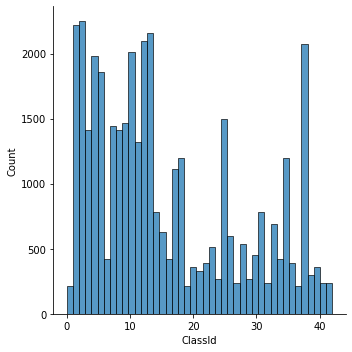

In [36]:
#hist = training_images_metadata.ClassId.hist(bins = Total_classes, linewidth=0.8)
sns.displot(df_training['ClassId'], bins = Total_classes )


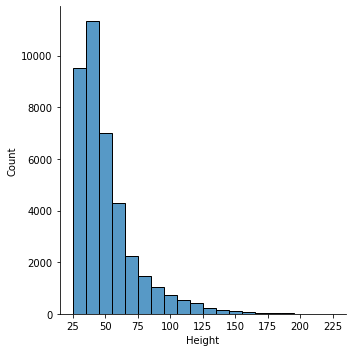

In [37]:
sns.displot(df_training['Height'], bins = 20 )

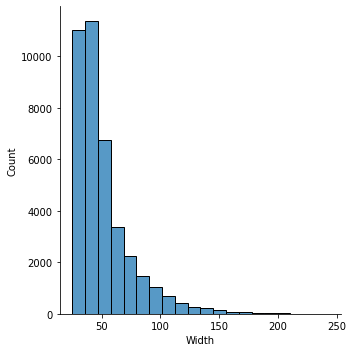

In [38]:
sns.displot(df_training['Width'], bins = 20 )

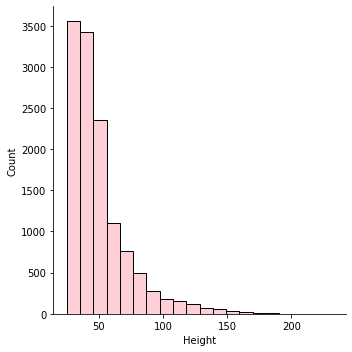

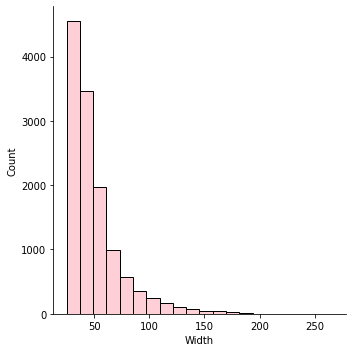

In [39]:
sns.displot(df_test['Height'], bins = 20, color="pink" )
sns.displot(df_test['Width'], bins = 20, color="pink" )

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3208: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return asarray(a).size
/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


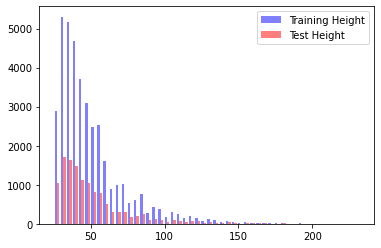

In [40]:
plt.hist([df_training['Height'], df_test['Height']], color=['b','r'], alpha=0.5, bins = 50, label = ["Training Height","Test Height"])
plt.legend()

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3208: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return asarray(a).size
/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


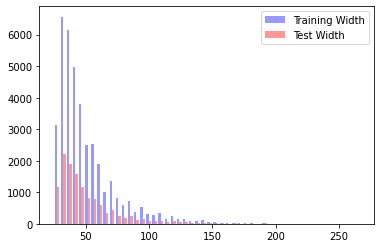

In [41]:
plt.hist([df_training['Width'], df_test['Width']], color=['b','r'], alpha=0.4, bins = 50, label = ["Training Width","Test Width"])
plt.legend()

In [42]:
#hist = df.ClassId.hist(bins = Total_classes, linewidth=0.8)

In [43]:
#Data from the histogram shows the density of classes is skewed to the lower end of the range.

#When it comes to pre-processing, this will need to be addressed or run the risk of over/under fitting when training the model.

Exploring the test data

In [44]:
#Test metadata - AD
#Note test metadata (by definition) does not contain classID parameter
test_images_metadata = pd.DataFrame(columns=['Filename','Width','Height','Roi.X1','Roi.Y1','Roi.X2','Roi.Y2'])

for dirpath, dirnames, filenames in os.walk(test_images_dir):
  for filename in filenames:
    if filename.endswith('.csv'):
      test_images_metadata = pd.concat((test_images_metadata, pd.read_csv(os.path.join(dirpath, filename), sep=';')))

test_images_metadata.head()


,Filename,Width,Height,Roi.X1,Roi.Y1,Roi.X2,Roi.Y2
0,00000.ppm,53,54,6,5,48,49
1,00001.ppm,42,45,5,5,36,40
2,00002.ppm,48,52,6,6,43,47
3,00003.ppm,27,29,5,5,22,24
4,00004.ppm,60,57,5,5,55,52


In [45]:
test_images_metadata.Width.min(), test_images_metadata.Width.max()

(25, 266)

In [46]:
test_images_metadata.Height.min(), test_images_metadata.Height.max()

(25, 232)

In [47]:
test_images_metadata.shape

(12630, 7)

In [48]:
test_images_metadata.describe()

,Filename,Width,Height,Roi.X1,Roi.Y1,Roi.X2,Roi.Y2
count,12630,12630,12630,12630,12630,12630,12630
unique,12630,173,163,19,15,167,156
top,00000.ppm,31,32,6,6,26,27
freq,1,479,479,5501,5704,498,477


Visualising random test images using Imread - https://pypi.org/project/imread/

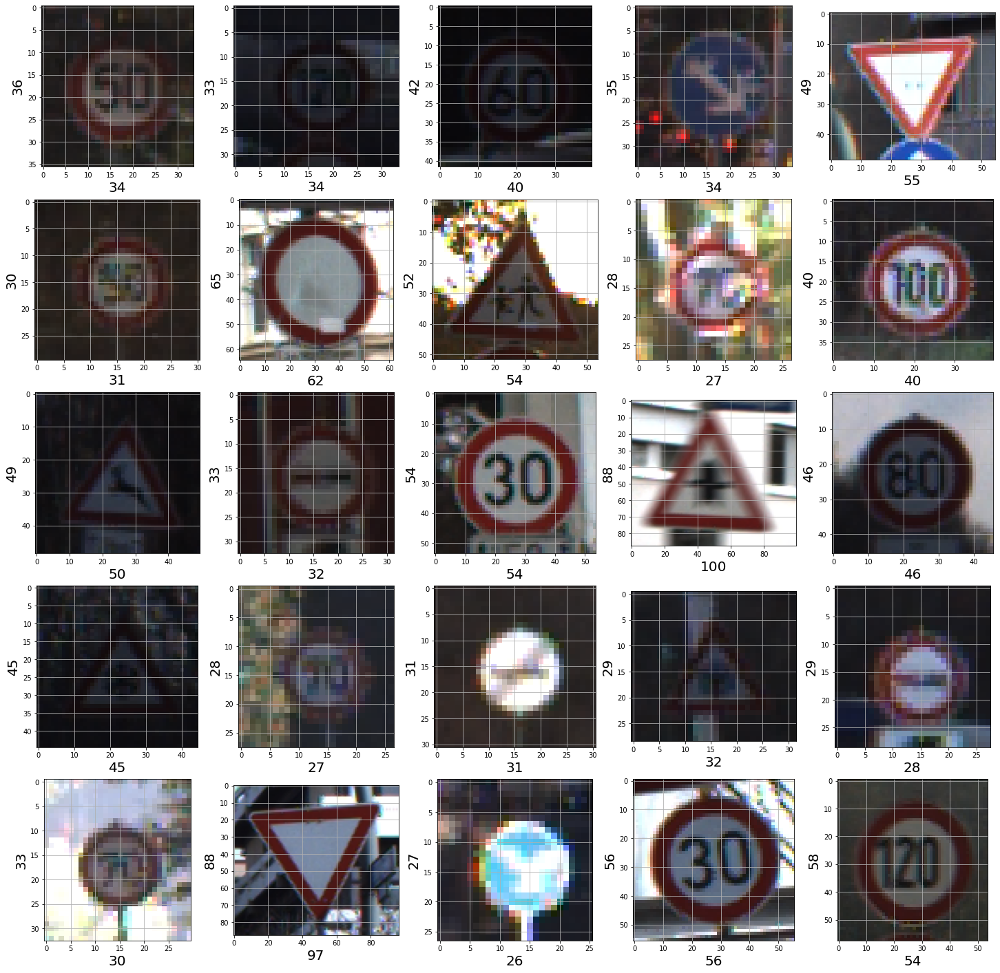

In [49]:
#Try to visualise some of the test data - AD
test_images = test_images_metadata["Filename"].values

plt.figure(figsize=(25,25))

for i in range(1,26):
    plt.subplot(5,5,i)
    random_image_path = test_images_dir + '/' + random.choice(test_images)
    rand_image = imread(random_image_path)
    plt.imshow(rand_image)
    plt.grid(b=None)
    plt.xlabel(rand_image.shape[1], fontsize = 20)#width of image
    plt.ylabel(rand_image.shape[0], fontsize = 20)#height of image

In [50]:
test_images_metadata["Filename"].values

array(['00000.ppm', '00001.ppm', '00002.ppm', ..., '12627.ppm',
       '12628.ppm', '12629.ppm'], dtype=object)

In [51]:
rand_image.shape

(58, 54, 3)

In [52]:
print(test_images)

['00000.ppm' '00001.ppm' '00002.ppm' ... '12627.ppm' '12628.ppm'
 '12629.ppm']


We need to collect the training data into useable format - https://pypi.org/project/opencv-python/

In [53]:
print(training_images_dir)
training_images_metadata

/root/.keras/datasets/GTSRB/Final_Training/Images


,Filename,Width,Height,Roi.X1,Roi.Y1,Roi.X2,Roi.Y2,ClassId
0,00000_00000.ppm,29,30,5,6,24,25,5
1,00000_00001.ppm,30,32,5,6,25,27,5
2,00000_00002.ppm,31,31,5,5,26,26,5
3,00000_00003.ppm,32,32,6,5,27,27,5
4,00000_00004.ppm,31,32,5,5,26,27,5
...,...,...,...,...,...,...,...,...
415,00013_00025.ppm,82,81,7,7,74,74,16
416,00013_00026.ppm,86,85,7,7,78,78,16
417,00013_00027.ppm,89,89,7,8,81,82,16
418,00013_00028.ppm,97,96,9,9,88,88,16


In [54]:
#Total number of classes for the training set - AD
Total_classes = len(os.listdir(training_images_dir))
print(Total_classes)

43


In [55]:
 #We need to collect the training data into useable format. - AD

import cv2
import os
from PIL import Image

#Need to parse through the files names (eg 00001, 00002....00042),
# adding them into the list, then convert to useable np array - AD
training_images_dir = '/root/.keras/datasets/GTSRB/Final_Training/Images'

image_data = []
image_labels = []

width = 30
height = 30

for i in range(Total_classes):
    if i <10:
      path = training_images_dir + "/" + "0000" + str(i)
    else:
      path = training_images_dir + "/" + "000" + str(i)
    images = os.listdir(path)
    for img in images:
        try:
          image = cv2.imread(path + '/' + img)
          image_fromarray = Image.fromarray(image, 'RGB')
          resize_image = image_fromarray.resize((height,width))
          image_data.append(np.array(resize_image))
          image_labels.append(i)
        except:
          pass
          #print("Error in " + img)

#Currently showing error for each "CSV" file in each folder - need to remove this - AD 

In [56]:
image_data = np.array(image_data)
image_labels = np.array(image_labels)

print(image_data.shape, image_labels.shape)

(78418, 30, 30, 3) (78418,)


In [57]:
# Class - Sign name
data = {'Class ID':[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42],
        'Sign Name': ['Speed limit (20km/h)','Speed limit (30km/h)', 'Speed limit (50km/h)','Speed limit (60km/h)','Speed limit (70km/h)','Speed limit (80km/h)','End of speed limit (80km/h)','Speed limit (100km/h)','Speed limit (120km/h)','No passing','No passing for vehicles over 3.5 metric tons','Right-of-way at the next intersection','Priority road','Yield','Stop','No vehicles','Vehicles over 3.5 metric tons prohibited','No entry','General caution','Dangerous curve to the left','Dangerous curve to the right','Double curve', 'Bumpy road','Slippery road','Road narrows on the right','Road work','Traffic signals','Pedestrians','Children crossing','Bicycles crossing','Beware of ice/snow','Wild animals crossing','End of all speed and passing limits','Turn right ahead','Turn left ahead','Ahead only','Go straight or right','Go straight or left','Keep right','Keep left','Roundabout mandatory','End of no passing','End of no passing by vehicles over 3.5 metric tons']}

#Note: Should probably source where we got these Sign Names from (e.g we undertook research on the topic and found this at www.xyz.com) - AD
signname = pd.DataFrame.from_dict(data)
signname

,Class ID,Sign Name
0,0,Speed limit (20km/h)
1,1,Speed limit (30km/h)
2,2,Speed limit (50km/h)
3,3,Speed limit (60km/h)
4,4,Speed limit (70km/h)
5,5,Speed limit (80km/h)
6,6,End of speed limit (80km/h)
7,7,Speed limit (100km/h)
8,8,Speed limit (120km/h)
9,9,No passing


In [58]:
signname.set_index('Class ID')

signname.loc[1]

Class ID                        1
Sign Name    Speed limit (30km/h)
Name: 1, dtype: object

### Test Images

In [59]:
test_images_metadata.head()

,Filename,Width,Height,Roi.X1,Roi.Y1,Roi.X2,Roi.Y2
0,00000.ppm,53,54,6,5,48,49
1,00001.ppm,42,45,5,5,36,40
2,00002.ppm,48,52,6,6,43,47
3,00003.ppm,27,29,5,5,22,24
4,00004.ppm,60,57,5,5,55,52


### Visualise all Images Classes






In [60]:
import csv

def readTrafficSigns(rootpath):
    '''Reads traffic sign data for German Traffic Sign Recognition Benchmark.

    Arguments: path to the traffic sign data, for example './GTSRB/Training'
    Returns:   list of images, list of corresponding labels'''
    images = [] # images
    labels = [] # corresponding labels
    # loop over all 42 classes
    for c in range(0,43):
        prefix = rootpath + '/' + format(c, '05d') + '/' # subdirectory for class
        gtFile = open(prefix + 'GT-'+ format(c, '05d') + '.csv') # annotations file
        gtReader = csv.reader(gtFile, delimiter=';') # csv parser for annotations file
        next(gtReader) # skip header
        # loop over all images in current annotations file
        for row in gtReader:
            images.append(plt.imread(prefix + row[0])) # the 1th column is the filename
            labels.append(row[7]) # the 8th column is the label
        gtFile.close()
    return images, labels

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  import sys


0 . Class :  Class ID                        0
Sign Name    Speed limit (20km/h)
Name: 0, dtype: object


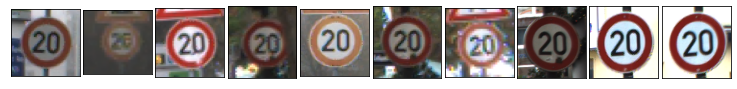

1 . Class :  Class ID                        1
Sign Name    Speed limit (30km/h)
Name: 1, dtype: object


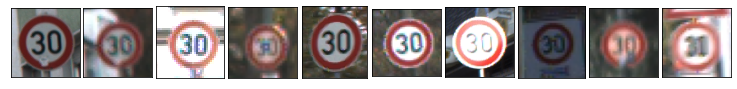

10 . Class :  Class ID                                               10
Sign Name    No passing for vehicles over 3.5 metric tons
Name: 10, dtype: object


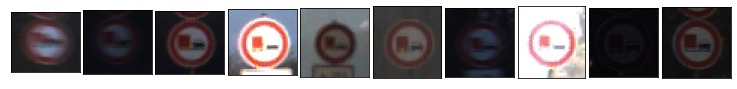

11 . Class :  Class ID                                        11
Sign Name    Right-of-way at the next intersection
Name: 11, dtype: object


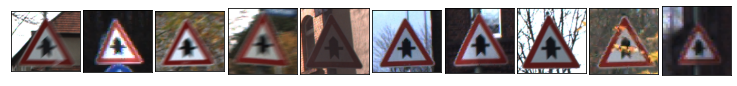

12 . Class :  Class ID                12
Sign Name    Priority road
Name: 12, dtype: object


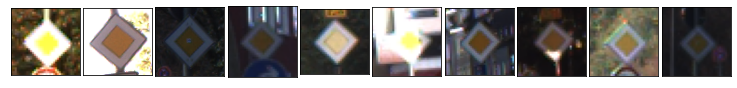

13 . Class :  Class ID        13
Sign Name    Yield
Name: 13, dtype: object


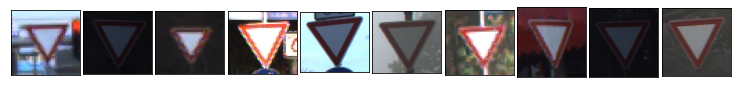

14 . Class :  Class ID       14
Sign Name    Stop
Name: 14, dtype: object


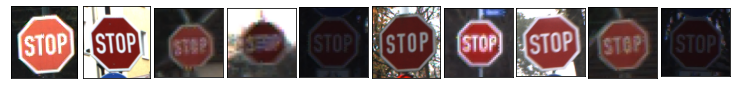

15 . Class :  Class ID              15
Sign Name    No vehicles
Name: 15, dtype: object


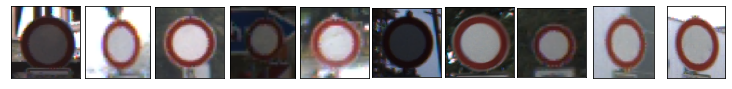

16 . Class :  Class ID                                           16
Sign Name    Vehicles over 3.5 metric tons prohibited
Name: 16, dtype: object


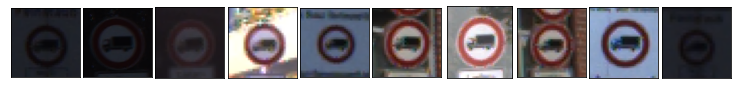

17 . Class :  Class ID           17
Sign Name    No entry
Name: 17, dtype: object


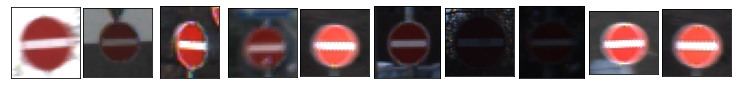

18 . Class :  Class ID                  18
Sign Name    General caution
Name: 18, dtype: object


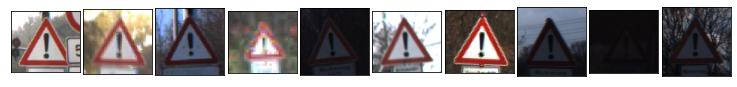

19 . Class :  Class ID                              19
Sign Name    Dangerous curve to the left
Name: 19, dtype: object


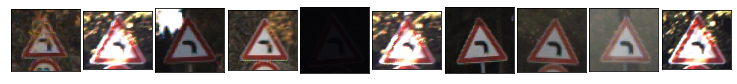

2 . Class :  Class ID                        2
Sign Name    Speed limit (50km/h)
Name: 2, dtype: object


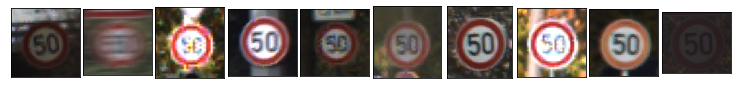

20 . Class :  Class ID                               20
Sign Name    Dangerous curve to the right
Name: 20, dtype: object


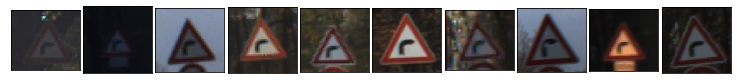

21 . Class :  Class ID               21
Sign Name    Double curve
Name: 21, dtype: object


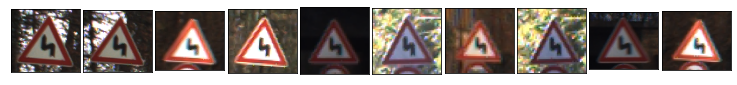

22 . Class :  Class ID             22
Sign Name    Bumpy road
Name: 22, dtype: object


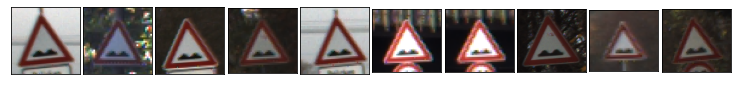

23 . Class :  Class ID                23
Sign Name    Slippery road
Name: 23, dtype: object


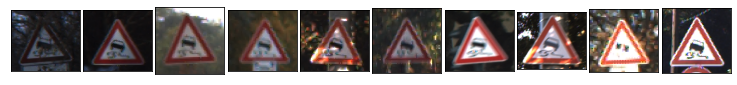

24 . Class :  Class ID                            24
Sign Name    Road narrows on the right
Name: 24, dtype: object


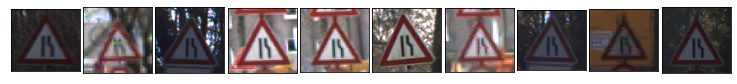

25 . Class :  Class ID            25
Sign Name    Road work
Name: 25, dtype: object


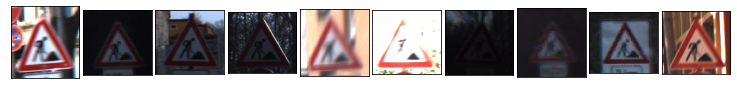

26 . Class :  Class ID                  26
Sign Name    Traffic signals
Name: 26, dtype: object


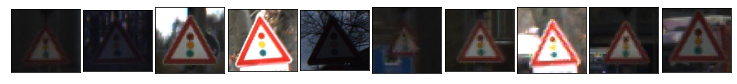

27 . Class :  Class ID              27
Sign Name    Pedestrians
Name: 27, dtype: object


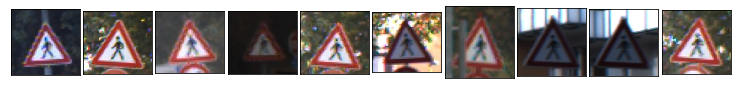

28 . Class :  Class ID                    28
Sign Name    Children crossing
Name: 28, dtype: object


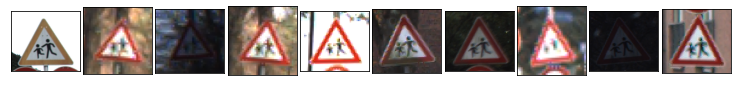

29 . Class :  Class ID                    29
Sign Name    Bicycles crossing
Name: 29, dtype: object


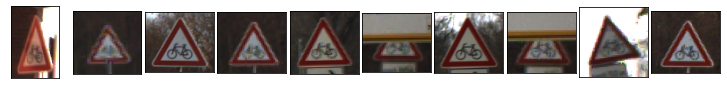

3 . Class :  Class ID                        3
Sign Name    Speed limit (60km/h)
Name: 3, dtype: object


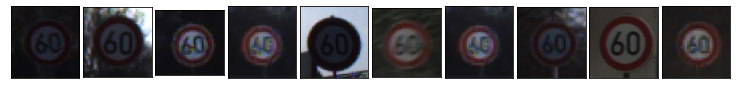

30 . Class :  Class ID                     30
Sign Name    Beware of ice/snow
Name: 30, dtype: object


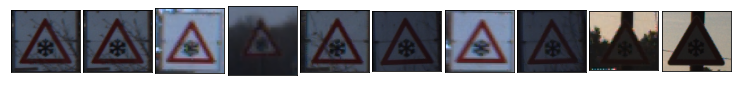

31 . Class :  Class ID                        31
Sign Name    Wild animals crossing
Name: 31, dtype: object


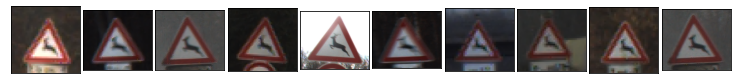

32 . Class :  Class ID                                      32
Sign Name    End of all speed and passing limits
Name: 32, dtype: object


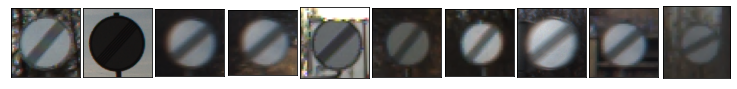

33 . Class :  Class ID                   33
Sign Name    Turn right ahead
Name: 33, dtype: object


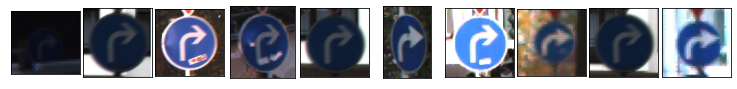

34 . Class :  Class ID                  34
Sign Name    Turn left ahead
Name: 34, dtype: object


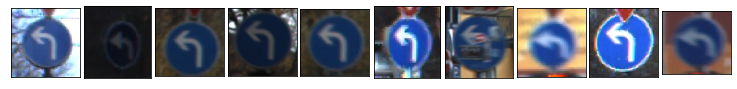

35 . Class :  Class ID             35
Sign Name    Ahead only
Name: 35, dtype: object


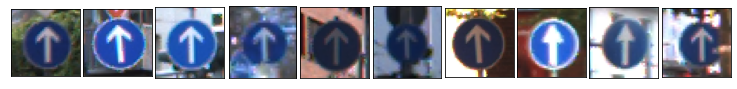

36 . Class :  Class ID                       36
Sign Name    Go straight or right
Name: 36, dtype: object


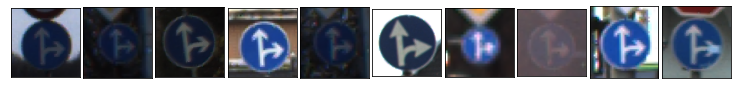

37 . Class :  Class ID                      37
Sign Name    Go straight or left
Name: 37, dtype: object


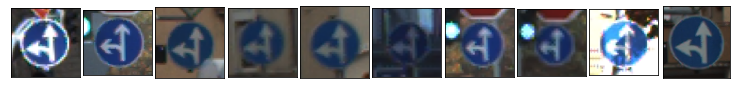

38 . Class :  Class ID             38
Sign Name    Keep right
Name: 38, dtype: object


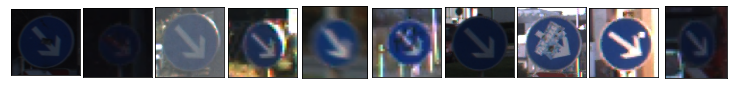

39 . Class :  Class ID            39
Sign Name    Keep left
Name: 39, dtype: object


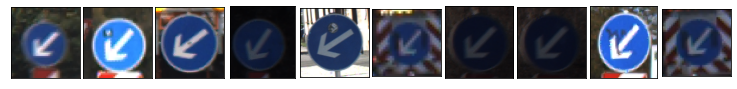

4 . Class :  Class ID                        4
Sign Name    Speed limit (70km/h)
Name: 4, dtype: object


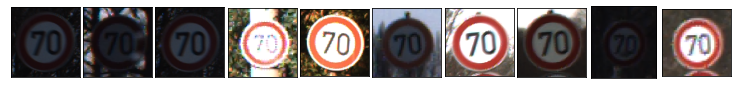

40 . Class :  Class ID                       40
Sign Name    Roundabout mandatory
Name: 40, dtype: object


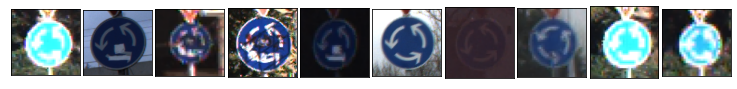

41 . Class :  Class ID                    41
Sign Name    End of no passing
Name: 41, dtype: object


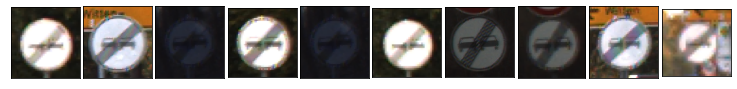

42 . Class :  Class ID                                                    42
Sign Name    End of no passing by vehicles over 3.5 metric ...
Name: 42, dtype: object


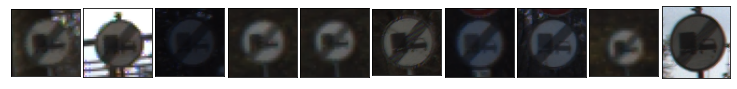

5 . Class :  Class ID                        5
Sign Name    Speed limit (80km/h)
Name: 5, dtype: object


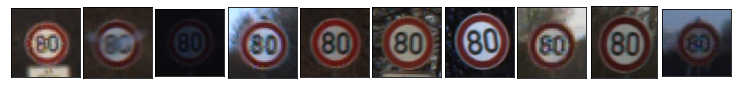

6 . Class :  Class ID                               6
Sign Name    End of speed limit (80km/h)
Name: 6, dtype: object


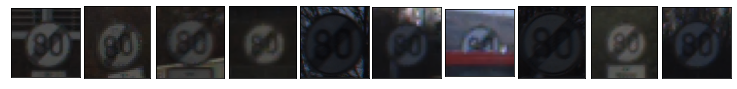

7 . Class :  Class ID                         7
Sign Name    Speed limit (100km/h)
Name: 7, dtype: object


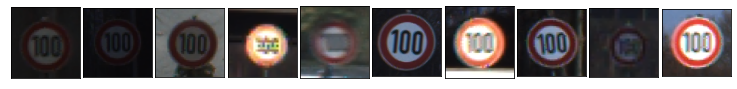

8 . Class :  Class ID                         8
Sign Name    Speed limit (120km/h)
Name: 8, dtype: object


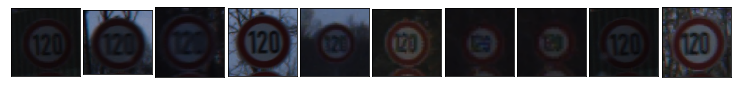

9 . Class :  Class ID              9
Sign Name    No passing
Name: 9, dtype: object


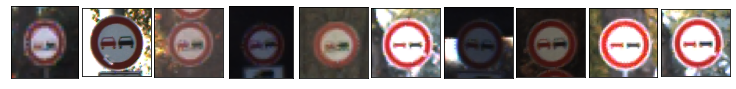

In [61]:

import numpy as np
from matplotlib import pyplot
import matplotlib.pyplot as plt

X_train_demo, trainLabels = readTrafficSigns(training_images_dir)
X_train_demo = np.asarray(X_train_demo)


classes, class_indices, class_counts  = np.unique(trainLabels, return_index=True, return_counts=True)
classes = classes.astype(np.int32)

for c, c_i, c_count in zip(classes, class_indices, class_counts):
    print(c, ". Class : ", signname.loc[c] )
    fig = pyplot.figure(figsize = (10, 1))
    fig.subplots_adjust(left = 0, right = 1, bottom = 0, top = 1, hspace = 0.05, wspace = 0.05)
    for i in range(10):
        axis = fig.add_subplot(1, 10, i + 1, xticks=[], yticks=[])
        random_indices = np.random.randint(c_i, c_i+c_count, 10)
        axis.imshow(X_train_demo[random_indices[i]])
        #axis.text(0, 0, '{}: {}'.format(c, sign_names[c]), color='k',backgroundcolor='c', fontsize=8)
        
    pyplot.show()

In [62]:
x_train_demo = training_images_metadata.drop(['ClassId'], axis =1)
# Number of training examples
n_train = x_train_demo.shape[0]

print("Number of training examples =", n_train)
#print("Number of classes =", n_classes)

#for info - MTH


Number of training examples = 39209


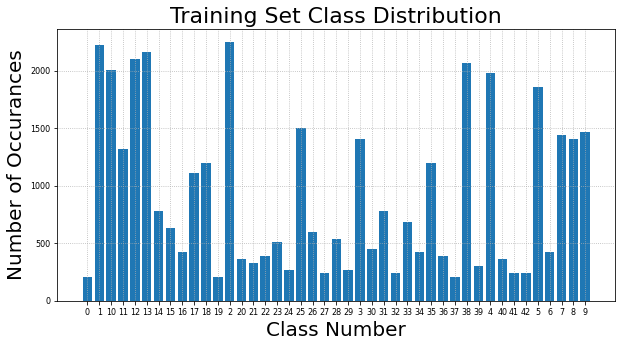

In [63]:
plt.figure(0, figsize = (10,5))
unique_train, counts_train = np.unique(trainLabels, return_counts = True)
plt.bar(unique_train, counts_train)
 
plt.title('Training Set Class Distribution', fontsize=22)
plt.xlabel('Class Number', fontsize=20)
plt.ylabel('Number of Occurances', fontsize=20)
plt.tick_params(labelsize=8)
plt.grid(linestyle=':')

FYI different matplotlib styles can be found at: https://tonysyu.github.io/raw_content/matplotlib-style-gallery/gallery.html

## Pre-Processing

### Pre-Processing- Functions and Visualization

Setting up image processing enviornment

In [64]:
import itertools
import skimage
from skimage.transform import warp, AffineTransform
import random
from PIL import Image, ImageEnhance
import math

EXTRACTING IMAGE AND CLASS TRAINING DATA

In [65]:
X_train_demo, trainLabels = readTrafficSigns(training_images_dir)
X_train_demo = np.asarray(X_train_demo)
Y_train_d = np.asarray(trainLabels)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  


DATA SHUFFLING

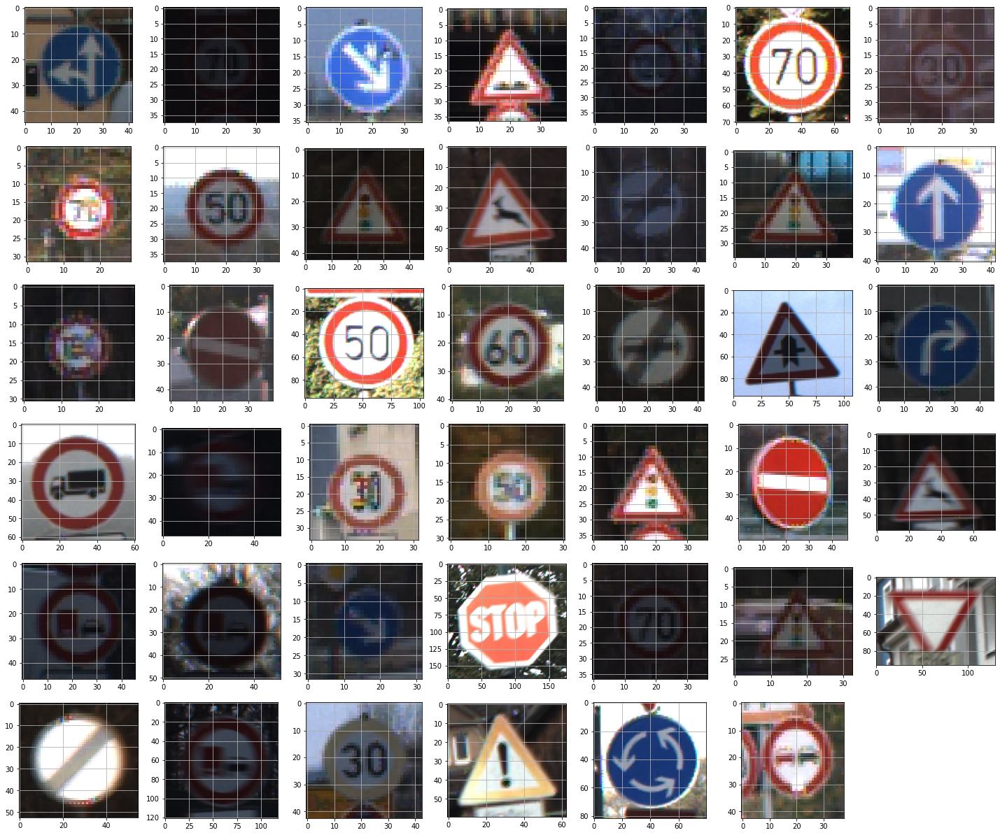

In [66]:
import sklearn
from sklearn.utils import shuffle
X_train, Y_train_d = shuffle(X_train_demo, Y_train_d)

plt.figure(figsize=(25,25))
for i in range(1,42):
    plt.subplot(7,7,i)
    plt.imshow(X_train[i])
    plt.grid(b=None)

IMAGE ENHANCEMENT

In [67]:
import cv2

In [68]:
def image_enhance(images):
  global X_train_en
  X_train_en = []
  img = images.copy()
  a = 1.4 # contrast control 
  b = 25 # brightness control 
  for i in range(img.shape[0]):
    img[i] = cv2.convertScaleAbs(img[i],alpha = a, beta = b)
    X_train_en.append(img[i])
  X_train_en = np.asarray(X_train_en)
  return X_train_en

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  # Remove the CWD from sys.path while we load stuff.


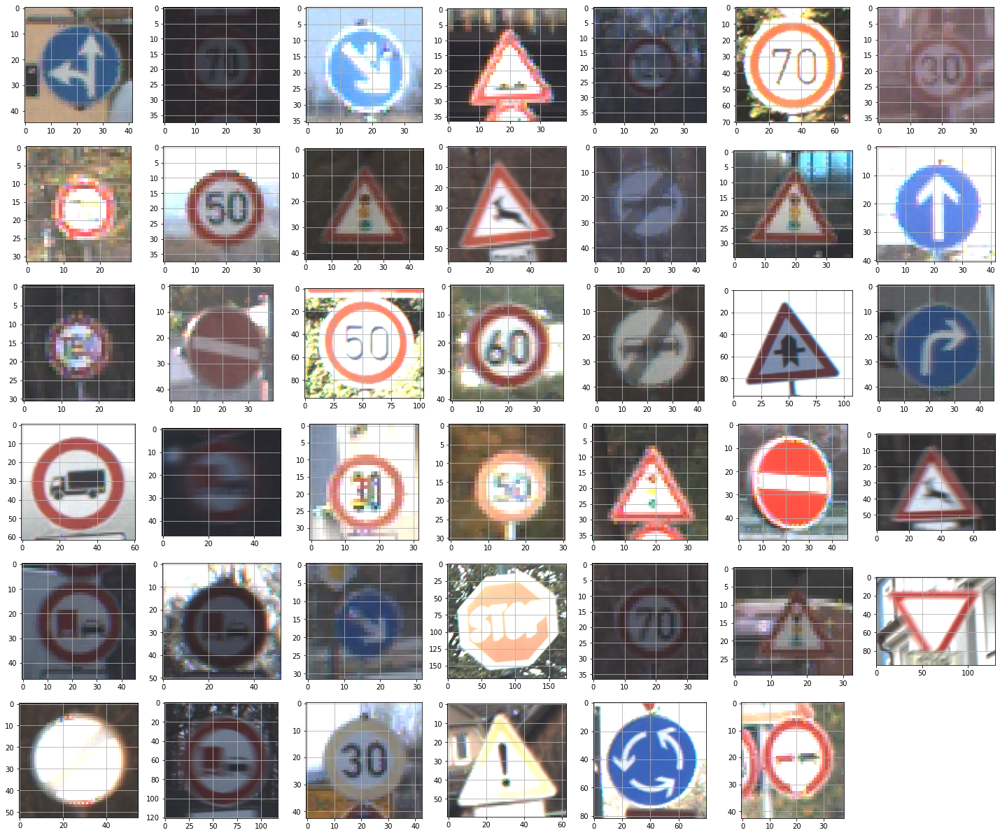

In [69]:
image_enhance(X_train)

plt.figure(figsize=(25,25))
for i in range(1,42):
    plt.subplot(7,7,i)
    plt.imshow(X_train_en[i], vmin = 0, vmax = 255)
    plt.grid(b=None)

GRAY SCALING IMAGES

In [70]:
from skimage import color
from skimage import io 

def rgb2grayscale(images):
  global X_train_g
  X_train_g = []
  img = images.copy()
  for i in range(img.shape[0]):
    img[i] = cv2.cvtColor(img[i], cv2.COLOR_RGB2GRAY)
    X_train_g.append(img[i])
  X_train_g = np.asarray(X_train_g)
  return X_train_g

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  # This is added back by InteractiveShellApp.init_path()


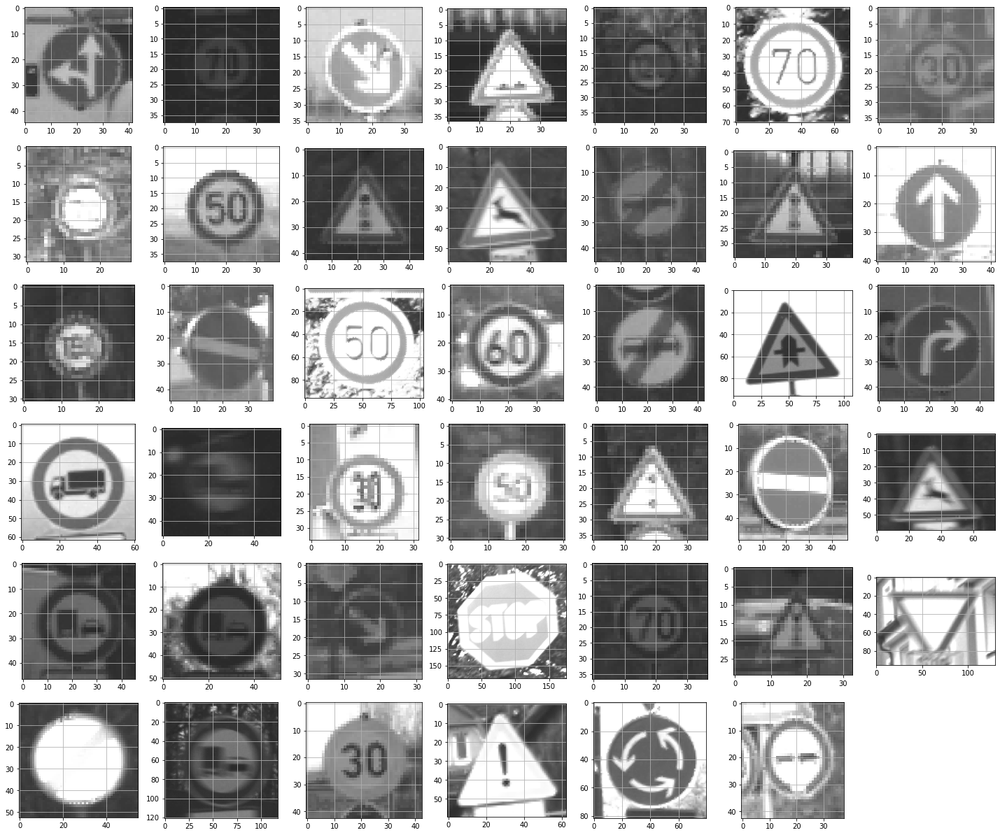

In [71]:
rgb2grayscale(X_train_en)

plt.figure(figsize=(25,25))
for i in range(1,42):
    plt.subplot(7,7,i)
    plt.imshow(X_train_g[i], cmap='gray', vmin = 0, vmax = 255)
    plt.grid(b=None)

 **Applying Lighting Correction**

Two Techniques to be tried- best one to be selected

1. Adaptive Thresholding

In [72]:
def gaussian_smoothing(img):
    return cv2.GaussianBlur(img, (3, 3), 0)

def adaptive_gaussian_thresholding(images):
  global X_train_gat
  X_train_gat = []
  img = images.copy()
  for i in range(img.shape[0]):
    img[i] = gaussian_smoothing(img[i])
    img[i] = cv2.adaptiveThreshold(img[i],
                                  255,
                                  cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                  cv2.THRESH_BINARY, 3, 2)
    X_train_gat.append(img[i])
  X_train_gat = np.asarray(X_train_gat)
  return X_train_gat

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  from ipykernel import kernelapp as app


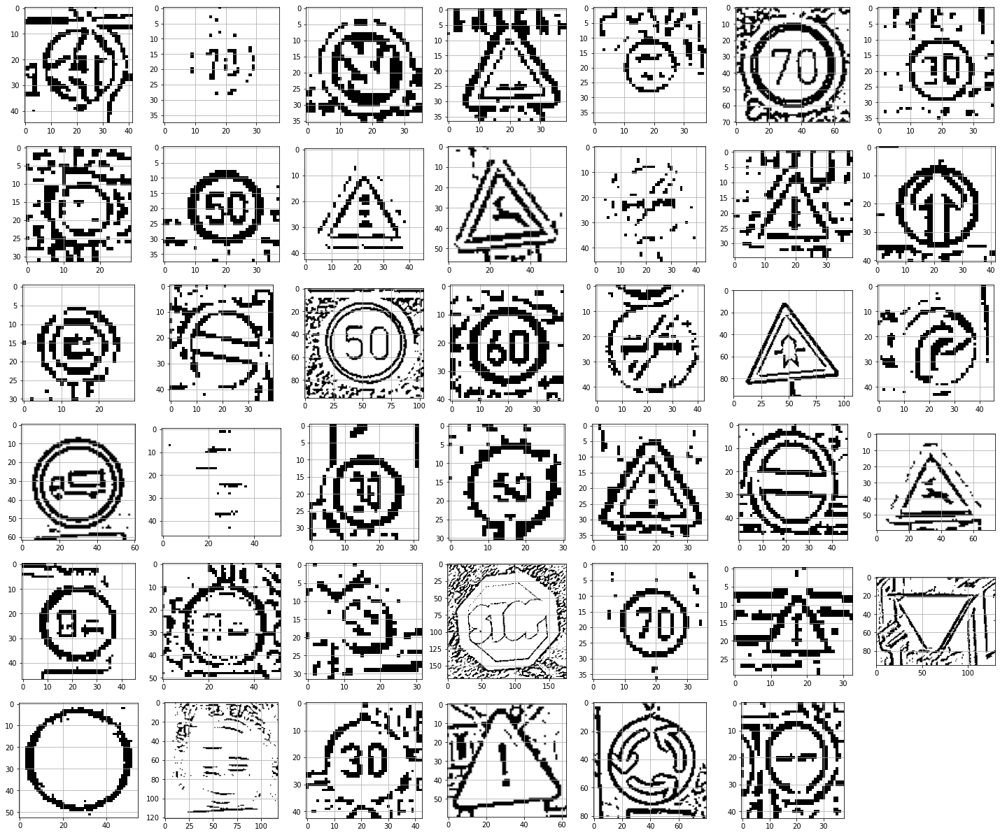

In [73]:
adaptive_gaussian_thresholding(X_train_g)

plt.figure(figsize=(25,25))
for i in range(1,42):
    plt.subplot(7,7,i)
    plt.imshow(X_train_gat[i],cmap= 'gray')
    plt.grid(b=None)

2. Adaptive Historgram Equalization

In [74]:
def clahe(images):
  global X_train_ahe
  X_train_ahe = []
  img = images.copy()
  for i in range(img.shape[0]):
    clahe = cv2.createCLAHE(clipLimit=10, tileGridSize=(2, 2))
    img[i] = clahe.apply(img[i])
    X_train_ahe.append(img[i])
  X_train_ahe = np.asarray(X_train_ahe)
  return X_train_ahe

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  if __name__ == '__main__':


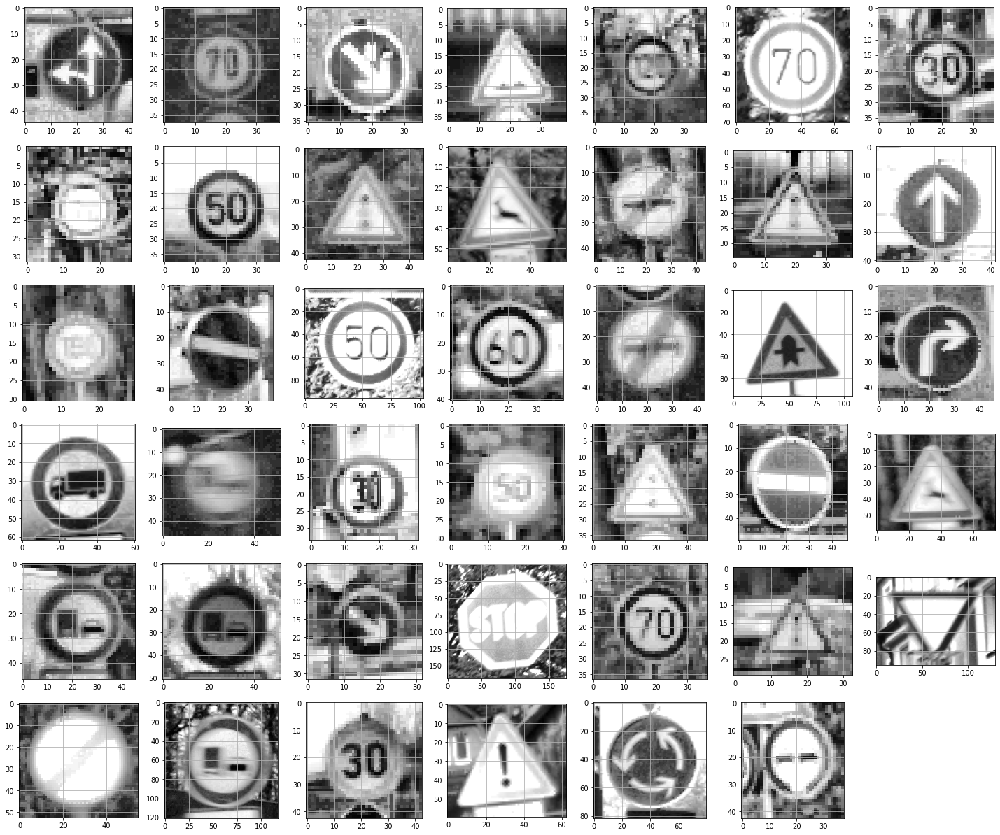

In [75]:
clahe(X_train_g)

plt.figure(figsize=(25,25))
for i in range(1,42):
    plt.subplot(7,7,i)
    plt.imshow(X_train_ahe[i], cmap='gray', vmin = 0, vmax = 255)
    plt.grid(b=None)

IMAGE RESIZING

In [76]:
def resizer(images):
  global X_train_re
  X_train_re = []
  img = images.copy()
  new_width = 128
  new_height = 128
  for i in range(0,39208):
    img[i] = cv2.resize(img[i], (new_width, new_height),interpolation=cv2.INTER_NEAREST)
    X_train_re.append(img[i])
  X_train_re = np.asarray(X_train_re)
  return X_train_re

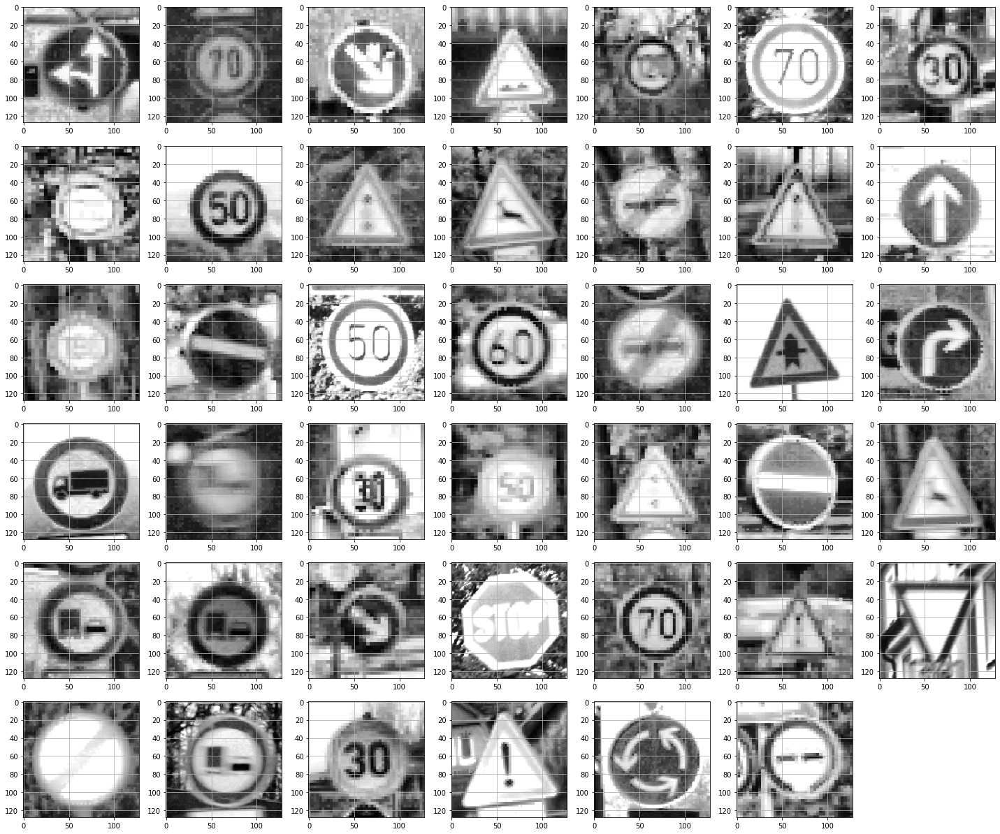

In [77]:
resizer(X_train_ahe)

plt.figure(figsize=(25,25))
for i in range(1,42):
    plt.subplot(7,7,i)
    plt.imshow(X_train_re[i], cmap='gray', vmin = 0, vmax = 255)
    plt.grid(b=None)

***DATA AUGMENTATION TO REMOVE DATA IMBALANCE*** 

In [78]:
#SETTING UP REQUIRED ENVIRONMENT
from skimage.transform import rotate
from skimage.transform import warp
from skimage.transform import ProjectiveTransform
import cv2

#classes, class_indices, class_counts  = np.unique(Y_train_d, return_index=True, return_counts=True)
#Y_train_d = np.asarray(trainLabels)
#n_classes = len(class_counts)

In [79]:
#DEFINING DATA AUGMENTATION FUNCTIONS

#IMAGE ROTATION

def rotate_image(image, max_angle =15):
    rotate_out = rotate(image, np.random.uniform(-max_angle, max_angle), mode='edge')
    return rotate_out

#IMAGE TRANSLATION

def translate_image(image, max_trans = 5, height=128, width=128):
    translate_x = max_trans*np.random.uniform() - max_trans/2
    translate_y = max_trans*np.random.uniform() - max_trans/2
    translation_mat = np.float32([[1,0,translate_x],[0,1,translate_y]])
    trans = cv2.warpAffine(image, translation_mat, (height,width))
    return trans

#PROJECTION

def projection_transform(image, max_warp=0.8, height=128, width=128):
    #Warp Location
    d = height * 0.3 * np.random.uniform(0,max_warp)
    
    #Warp co-ordinates
    tl_top = np.random.uniform(-d, d)     # Top left corner, top margin
    tl_left = np.random.uniform(-d, d)    # Top left corner, left margin
    bl_bottom = np.random.uniform(-d, d)  # Bottom left corner, bottom margin
    bl_left = np.random.uniform(-d, d)    # Bottom left corner, left margin
    tr_top = np.random.uniform(-d, d)     # Top right corner, top margin
    tr_right = np.random.uniform(-d, d)   # Top right corner, right margin
    br_bottom = np.random.uniform(-d, d)  # Bottom right corner, bottom margin
    br_right = np.random.uniform(-d, d)   # Bottom right corner, right margin
        
    ##Apply Projection
    transform = ProjectiveTransform()
    transform.estimate(np.array((
                (tl_left, tl_top),
                (bl_left, height - bl_bottom),
                (height - br_right, height - br_bottom),
                (height - tr_right, tr_top)
            )), np.array((
                (0, 0),
                (0, height),
                (height, height),
                (height, 0)
            )))
    output_image = warp(image, transform, output_shape=(height, width), order = 1, mode = 'edge')
    return output_image

def transform_image(image, max_angle=15, max_trans =5 ,max_warp=0.8):
    ## Simple pipline to take an input image and apply a serise of simple
    ## Distortions to augment the training data set
    ## (note: this function will rescale pixel values between 0-1)
    ##
    height, width = 128,128
    #Rotate Image
    rotated_image = rotate_image(image, max_angle)
    #Translate Image
    translated_image = translate_image(rotated_image, max_trans, height, width)
    #Project Image
    output_image = projection_transform(translated_image, max_warp, height, width)
    return (output_image*255.0).astype(np.uint8)

EXAMPLE OF ROTATION

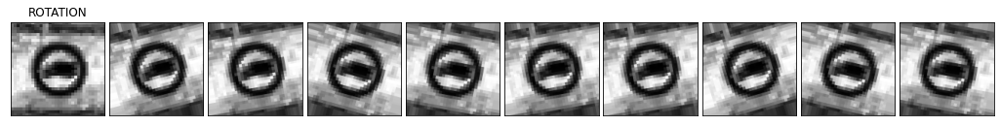

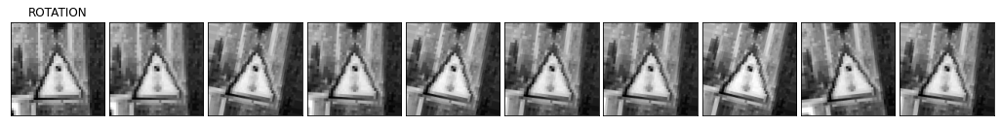

In [80]:
n_train = X_train_ahe.shape[0]

no_examples = 2
image = np.random.randint(0, n_train, no_examples)

for j in range(no_examples):
    fig = pyplot.figure(figsize = (14, 2))
    fig.subplots_adjust(left = 0, right = 1, bottom = 0, top = 1, hspace = 0.05, wspace = 0.05)
    for i in range(10):
        axis = fig.add_subplot(1, 10, i + 1, xticks=[], yticks=[])
        if i == 0:
            axis.imshow(X_train_re[image[j]],cmap = 'gray')
            axis.title.set_text('ROTATION')
        else:    
            axis.imshow(rotate_image(X_train_re[image[j]],20),cmap = 'gray')
    pyplot.show()

EXAMPLE OF TRANSLATION

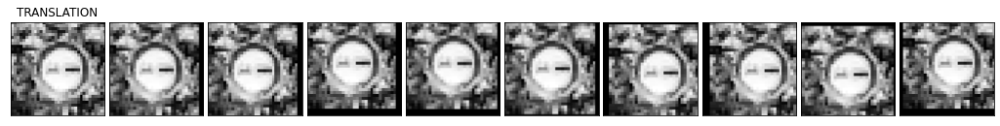

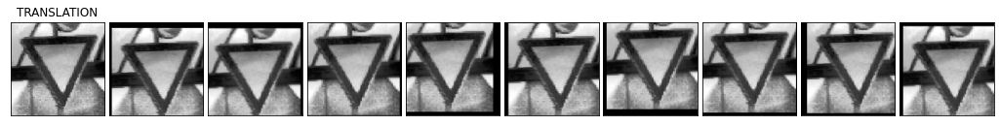

In [81]:
no_examples = 2
image = np.random.randint(0, n_train, no_examples)

for j in range(no_examples):
    fig = pyplot.figure(figsize = (14, 2))
    fig.subplots_adjust(left = 0, right = 1, bottom = 0, top = 1, hspace = 0.05, wspace = 0.05)
    for i in range(10):
        axis = fig.add_subplot(1, 10, i + 1, xticks=[], yticks=[])
        if i == 0:
            axis.imshow(X_train_re[image[j]],cmap='gray')
            axis.title.set_text('TRANSLATION')
        else:    
            axis.imshow(translate_image(X_train_re[image[j]], 20),cmap='gray')
    pyplot.show()

EXAMPLE OF PROJECTION

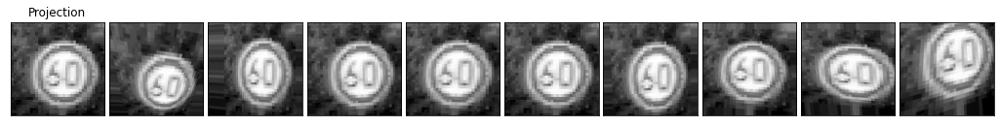

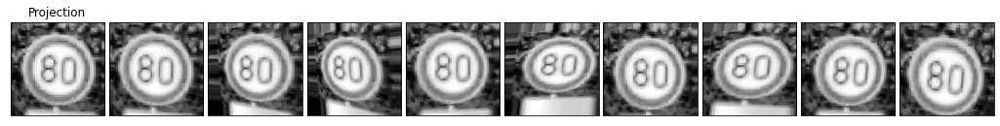

In [82]:
no_examples = 2
image = np.random.randint(0, n_train, no_examples)

for j in range(no_examples):
    fig = pyplot.figure(figsize = (14, 2))
    fig.subplots_adjust(left = 0, right = 1, bottom = 0, top = 1, hspace = 0.05, wspace = 0.05)
    for i in range(10):
        axis = fig.add_subplot(1, 10, i + 1, xticks=[], yticks=[])
        if i == 0:
            axis.imshow(X_train_re[image[j]],cmap='gray')
            axis.title.set_text('Projection')
        else:    
            axis.imshow(projection_transform(X_train_re[image[j]]),cmap='gray')
    pyplot.show()

EXAMPLE OF TRANSFORMATION (TRANSLATION - ROTATION - PROJECTION)

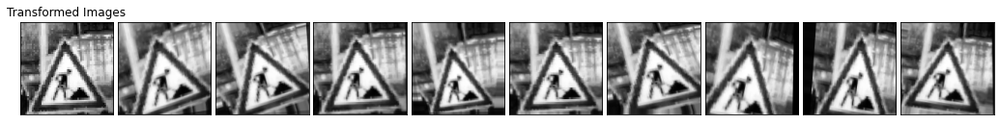

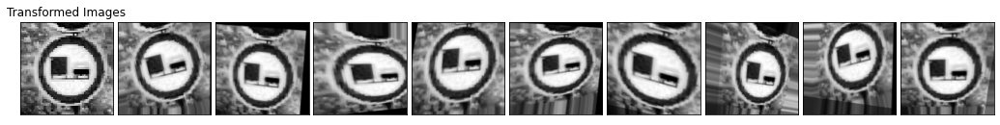

In [83]:
no_examples = 2
image = np.random.randint(0, n_train, no_examples)

for j in range(no_examples):
    fig = pyplot.figure(figsize = (14, 2))
    fig.subplots_adjust(left = 0, right = 1, bottom = 0, top = 1, hspace = 0.05, wspace = 0.05)
    for i in range(10):
        axis = fig.add_subplot(1, 10, i + 1, xticks=[], yticks=[])
        if i == 0:
            axis.imshow(X_train_re[image[j]],cmap='gray')
            axis.title.set_text('Transformed Images')
        else:    
            axis.imshow(transform_image(X_train_re[image[j]]),cmap='gray')
    pyplot.show()

In [84]:
def image_augmentation(images,labels):
  height = 128
  width = 128
  X_train_aug = images.copy()
  Y_train_aug = labels
  classes, class_indices, class_counts  = np.unique(Y_train_aug, return_index=True, return_counts=True)
  n_classes = len(class_counts)
  for c in range(n_classes):
    doca = np.where((Y_train_aug == str(c)))
    doca = np.asarray(doca)
    x_act = X_train_re[doca[0,:doca.size-1]]  
    req = 3000 - x_act.shape[0]
    cop = math.floor(3000/x_act.shape[0])
    print ('Class ',c,':',req,cop)
    dum_aug=[]
    for j in doca:
      for k in j:
        for i in range(cop):
          if x_act.shape[0] >1300 and len(dum_aug) > 1300:
              break
          if k<39208:
            dum = transform_image(X_train_re[k])
            dum_aug.append(dum)
          elif k==39208:
            dum = dum = transform_image(X_train_re[k-1])
            dum_aug.append(dum)
    dum_aug = np.asarray(dum_aug)
    pet = np.repeat(c,dum_aug.shape[0])
    X_train_aug = np.append(X_train_aug,dum_aug,axis=0)   
    Y_train_aug = np.append(Y_train_aug,pet)
  Y_train_aug = np.delete(Y_train_aug,0,0)
  return X_train_aug, Y_train_aug

In [85]:
import sklearn
from sklearn.utils import shuffle

def Shuffler(images,labels):
  s_images, s_labels = shuffle(images, labels)
  return s_images, s_labels


### PREPROCESSING PIPELINE

Main Preprocessing Pipeline/Function

In [86]:
def preprocessingpipe(images,labels,enhance=True,Gray=True,CLAHE=True,RESIZE=True,AUGMENT=True,Shuffle=True):
  if enhance == True:
    enhanced_images = image_enhance(images)
    print('Enhanced')
  else:
    enhanced_images = images.copy()
  if Gray == True:
    gray_images = rgb2grayscale(enhanced_images)
    print('Grayed')
  else:
    gray_images = enhanced_images.copy()
  if CLAHE == True:
    equalized_images = clahe(gray_images)
    print('Equalized')
  else: 
    equalized_images = gray_images.copy()
  if RESIZE == True:
    resized_images = resizer(equalized_images)
    print('Resized')
  else: 
    resized_images = equalized_images.copy()
  if AUGMENT == True:
    X_raw,Y_raw = image_augmentation(resized_images,labels)
    print('Augmented')
  else:
    X_raw,Y_raw = resized_images.copy(), Y_train_d
  if Shuffle == True:
    X, Y = Shuffler(X_raw,Y_raw)
    print('Shuffled')
  else: 
    X, Y = X_raw.copy(),Y_raw.copy()
  return X,Y

In [87]:
X_train_raw, trainLabels = readTrafficSigns(training_images_dir)
X_train_raw = np.asarray(X_train_raw)
Y_train_raw = np.asarray(trainLabels)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  


In [88]:
X_train,Y_train = preprocessingpipe(X_train_raw,Y_train_raw)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  # Remove the CWD from sys.path while we load stuff.


Enhanced


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  # This is added back by InteractiveShellApp.init_path()


Grayed


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  if __name__ == '__main__':


Equalized
Resized
Class  0 : 2791 14
Class  1 : 781 1
Class  2 : 751 1
Class  3 : 1591 2
Class  4 : 1021 1
Class  5 : 1141 1
Class  6 : 2581 7
Class  7 : 1561 2
Class  8 : 1591 2
Class  9 : 1531 2
Class  10 : 991 1
Class  11 : 1681 2
Class  12 : 901 1
Class  13 : 841 1
Class  14 : 2221 3
Class  15 : 2371 4
Class  16 : 2581 7
Class  17 : 1891 2
Class  18 : 1801 2
Class  19 : 2791 14
Class  20 : 2641 8
Class  21 : 2671 9
Class  22 : 2611 7
Class  23 : 2491 5
Class  24 : 2731 11
Class  25 : 1501 2
Class  26 : 2401 5
Class  27 : 2761 12
Class  28 : 2461 5
Class  29 : 2731 11
Class  30 : 2551 6
Class  31 : 2221 3
Class  32 : 2761 12
Class  33 : 2312 4
Class  34 : 2581 7
Class  35 : 1801 2
Class  36 : 2611 7
Class  37 : 2791 14
Class  38 : 931 1
Class  39 : 2701 10
Class  40 : 2641 8
Class  41 : 2761 12
Class  42 : 2761 12
Augmented
Shuffled


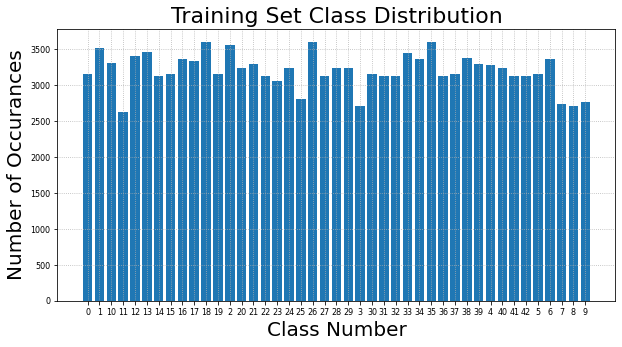

In [89]:
plt.figure(0, figsize = (10,5))
unique_train, counts_train = np.unique(Y_train, return_counts = True)
plt.bar(unique_train, counts_train)
 
plt.title('Training Set Class Distribution', fontsize=22)
plt.xlabel('Class Number', fontsize=20)
plt.ylabel('Number of Occurances', fontsize=20)
plt.tick_params(labelsize=8)
plt.grid(linestyle=':')

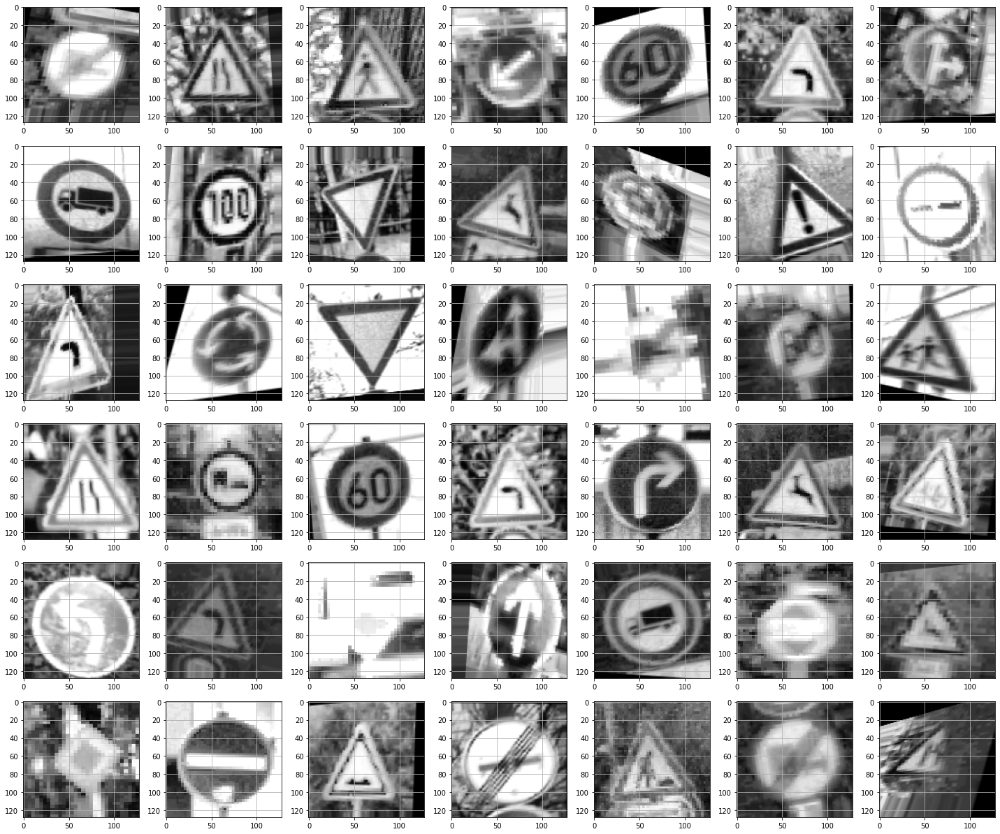

In [90]:
plt.figure(figsize=(25,25))
for i in range(80000,80042):
    plt.subplot(7,7,i-79999)
    plt.imshow(X_train[i], cmap='gray', vmin = 0, vmax = 255)
    plt.grid(b=None)

In [91]:
print('Size of X_train:',X_train.size)
print('Size of Y_train:',Y_train.size)
print('Shape of X_train:',X_train.shape)
print('Shape of Y_train:',Y_train.shape)

Size of X_train: 2255060992
Size of Y_train: 137638
Shape of X_train: (137638, 128, 128)
Shape of Y_train: (137638,)


Splitting Training Data into Training and Validation Sets

In [93]:
from sklearn.model_selection import train_test_split

In [94]:
X_train, X_val, y_train, y_val = train_test_split(X_train, Y_train, test_size=0.25, random_state=42)

In [95]:
print('Size of X_train:',X_train.size)
print('Size of Y_train:',y_train.size)
print('Shape of X_train:',X_train.shape)
print('Shape of Y_train:',y_train.shape)

Size of X_train: 1691287552
Size of Y_train: 103228
Shape of X_train: (103228, 128, 128)
Shape of Y_train: (103228,)


## Implementation 

### Setup

Define metrics.

In [96]:
metrics = ['accuracy']

### Pre-Processing

#### Enhance

Function to enhance an image.

In [97]:
def enhance(image):
  return image

Print sample of dataset.

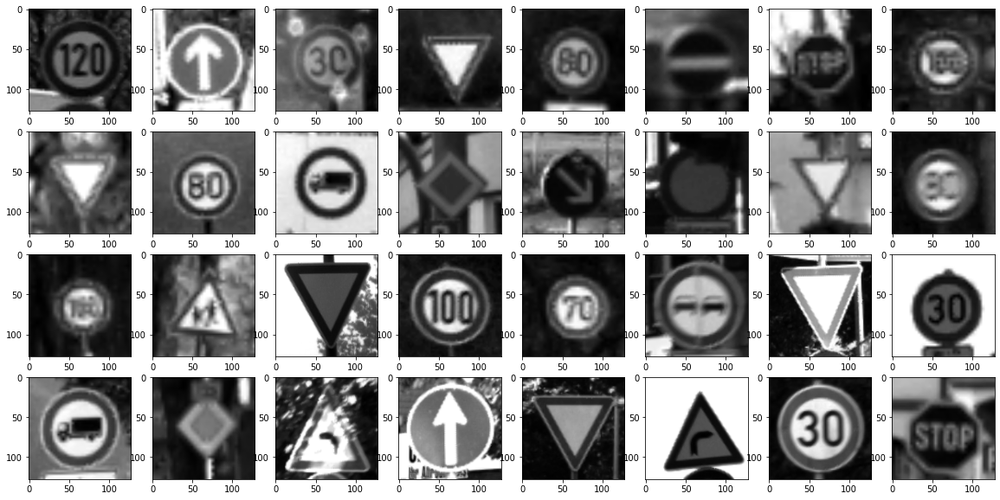

In [98]:
image_sample_function(training_dataset, enhance)

In [99]:
enhance_layer = tf.keras.layers.Lambda(enhance)

#### Equalize

Function to equalize an image.

In [100]:
def equalize(image):
  return image

Print sample of dataset.

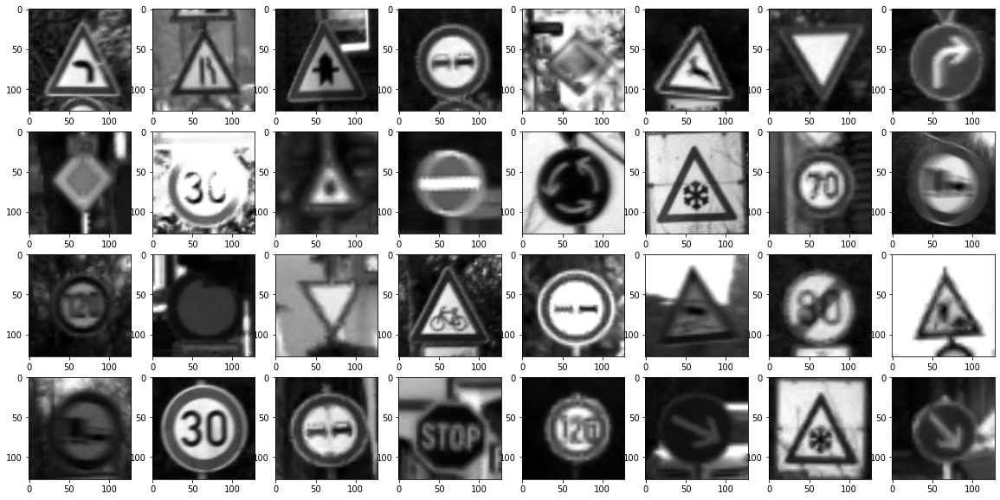

In [101]:
image_sample_function(training_dataset, equalize)

In [102]:
equalize_layer = tf.keras.layers.Lambda(equalize)

#### Augment

Augmentation sequence, rotate and translate.


In [103]:
augmentation = tf.keras.Sequential([
  tf.keras.layers.experimental.preprocessing.RandomRotation(0.1),
])

### Multi-Layer Perceptron (MLP)

Define the model.


In [104]:
mlp_model = tf.keras.models.Sequential()

mlp_model.add(tf.keras.layers.experimental.preprocessing.Rescaling(1./255))

mlp_model.add(tf.keras.layers.Flatten(input_shape=(128, 128)))

mlp_model.add(tf.keras.layers.Dense(256, activation="relu"))
mlp_model.add(tf.keras.layers.Dense(128, activation="relu"))   
mlp_model.add(tf.keras.layers.Dense(64, activation="relu"))

mlp_model.add(tf.keras.layers.Dense(43, activation="softmax"))

Compile the model.


In [105]:
mlp_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=metrics)

Add early stopping callback.


In [106]:
callbacks = [
  tf.keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True)
]

Train the model.

In [107]:
mlp_history = mlp_model.fit(
  training_dataset,
  epochs=50,
  callbacks=callbacks,
  validation_data=validation_dataset
)

Epoch 1/50
981/981 [==============================] - 29s 26ms/step - loss: 2.3260 - accuracy: 0.3833 - val_loss: 1.2020 - val_accuracy: 0.6693
Epoch 2/50
981/981 [==============================] - 22s 22ms/step - loss: 1.0472 - accuracy: 0.7103 - val_loss: 0.9098 - val_accuracy: 0.7511
Epoch 3/50
981/981 [==============================] - 21s 22ms/step - loss: 0.7482 - accuracy: 0.7917 - val_loss: 1.0628 - val_accuracy: 0.7134
Epoch 4/50
981/981 [==============================] - 21s 22ms/step - loss: 0.6548 - accuracy: 0.8137 - val_loss: 0.5732 - val_accuracy: 0.8370
Epoch 5/50
981/981 [==============================] - 21s 22ms/step - loss: 0.5823 - accuracy: 0.8341 - val_loss: 0.5824 - val_accuracy: 0.8380
Epoch 6/50
981/981 [==============================] - 22s 22ms/step - loss: 0.5042 - accuracy: 0.8535 - val_loss: 0.5563 - val_accuracy: 0.8449
Epoch 7/50
981/981 [==============================] - 22s 22ms/step - loss: 0.4716 - accuracy: 0.8614 - val_loss: 0.4865 - val_accuracy:

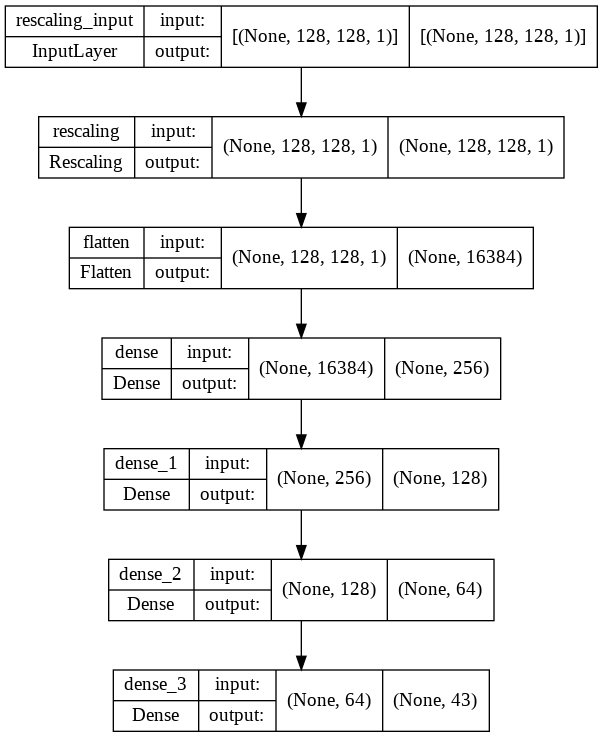

In [108]:
# Display internal structure of layers and nodes
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot, plot_model
SVG(model_to_dot(mlp_model).create(prog='dot', format='svg'))
plot_model(mlp_model, to_file='model_plot.png', show_shapes=True, show_layer_names=True, expand_nested=True)

Plot model `accuracy` vs `epoch`.

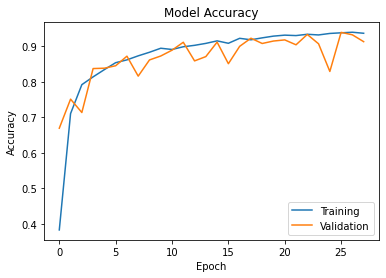

In [109]:
plt.title('Model Accuracy')

plt.xlabel('Epoch')
plt.ylabel('Accuracy')

plt.plot(mlp_history.history['accuracy'])
plt.plot(mlp_history.history['val_accuracy'])

plt.legend(['Training', 'Validation'])

plt.show()

Plot model `loss` vs `epoch`.

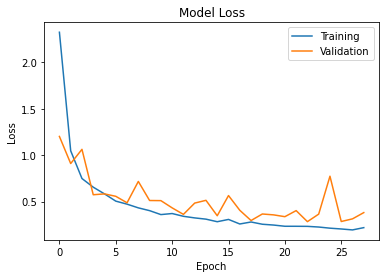

In [110]:
plt.title('Model Loss')

plt.xlabel('Epoch')
plt.ylabel('Loss')

plt.plot(mlp_history.history['loss'])
plt.plot(mlp_history.history['val_loss'])

plt.legend(['Training', 'Validation'])

plt.show()

Evaluate the model.


In [111]:
mlp_results = mlp_model.evaluate(test_dataset)

395/395 [==============================] - 10s 24ms/step - loss: 1.1484 - accuracy: 0.8413


Save the model.

In [112]:
mlp_model.save('mlp_model.h5')

### Convolutional Neural Network (CNN)

Define the model.

In [113]:
cnn_model = tf.keras.models.Sequential()

cnn_model.add(tf.keras.layers.experimental.preprocessing.Rescaling(1./255))

cnn_model.add(tf.keras.layers.Conv2D(64, 3, activation="relu", input_shape=(256, 256)))
cnn_model.add(tf.keras.layers.MaxPool2D(pool_size=2))

cnn_model.add(tf.keras.layers.Conv2D(128, 3, activation="relu"))
cnn_model.add(tf.keras.layers.MaxPool2D(pool_size=2))

cnn_model.add(tf.keras.layers.Conv2D(256, 3, activation="relu"))
cnn_model.add(tf.keras.layers.MaxPool2D(pool_size=2))

cnn_model.add(tf.keras.layers.Conv2D(512, 3, activation="relu"))
cnn_model.add(tf.keras.layers.MaxPool2D(pool_size=2))

cnn_model.add(tf.keras.layers.Flatten())

cnn_model.add(tf.keras.layers.Dense(256, activation="relu"))
cnn_model.add(tf.keras.layers.Dense(128, activation="relu"))
cnn_model.add(tf.keras.layers.Dense(64, activation="relu"))

cnn_model.add(tf.keras.layers.Dense(43, activation="softmax"))

Compile the model.

In [114]:
cnn_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=metrics)

Add early stopping callback.


In [115]:
callbacks = [
  tf.keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True)
]

Train the model.


In [116]:
cnn_history0 = cnn_model.fit(
  training_dataset,
  epochs=50,
  callbacks=callbacks,
  validation_data=validation_dataset
)

Epoch 1/50
981/981 [==============================] - 100s 88ms/step - loss: 1.5473 - accuracy: 0.5773 - val_loss: 0.1901 - val_accuracy: 0.9441
Epoch 2/50
981/981 [==============================] - 83s 85ms/step - loss: 0.1122 - accuracy: 0.9668 - val_loss: 0.0822 - val_accuracy: 0.9773
Epoch 3/50
981/981 [==============================] - 83s 85ms/step - loss: 0.0563 - accuracy: 0.9830 - val_loss: 0.0649 - val_accuracy: 0.9851
Epoch 4/50
981/981 [==============================] - 83s 85ms/step - loss: 0.0437 - accuracy: 0.9869 - val_loss: 0.0475 - val_accuracy: 0.9897
Epoch 5/50
981/981 [==============================] - 83s 85ms/step - loss: 0.0317 - accuracy: 0.9909 - val_loss: 0.0480 - val_accuracy: 0.9895
Epoch 6/50
981/981 [==============================] - 83s 85ms/step - loss: 0.0238 - accuracy: 0.9929 - val_loss: 0.0611 - val_accuracy: 0.9876
Epoch 7/50
981/981 [==============================] - 83s 85ms/step - loss: 0.0267 - accuracy: 0.9918 - val_loss: 0.1132 - val_accuracy

In [117]:
cnn_history = cnn_model.fit(
  training_dataset,
  epochs=50,
  callbacks=callbacks,
  validation_data=validation_dataset
)

Epoch 1/50
981/981 [==============================] - 84s 85ms/step - loss: 0.0398 - accuracy: 0.9881 - val_loss: 0.0731 - val_accuracy: 0.9841
Epoch 2/50
981/981 [==============================] - 83s 85ms/step - loss: 0.0221 - accuracy: 0.9936 - val_loss: 0.1101 - val_accuracy: 0.9778
Epoch 3/50
981/981 [==============================] - 83s 85ms/step - loss: 0.0242 - accuracy: 0.9939 - val_loss: 0.0551 - val_accuracy: 0.9878
Epoch 4/50
981/981 [==============================] - 83s 85ms/step - loss: 0.0199 - accuracy: 0.9946 - val_loss: 0.0780 - val_accuracy: 0.9865
Epoch 5/50
981/981 [==============================] - 83s 85ms/step - loss: 0.0187 - accuracy: 0.9949 - val_loss: 0.0463 - val_accuracy: 0.9907
Epoch 6/50
981/981 [==============================] - 83s 85ms/step - loss: 0.0206 - accuracy: 0.9943 - val_loss: 0.0826 - val_accuracy: 0.9832
Epoch 7/50
981/981 [==============================] - 83s 85ms/step - loss: 0.0162 - accuracy: 0.9960 - val_loss: 0.0448 - val_accuracy:

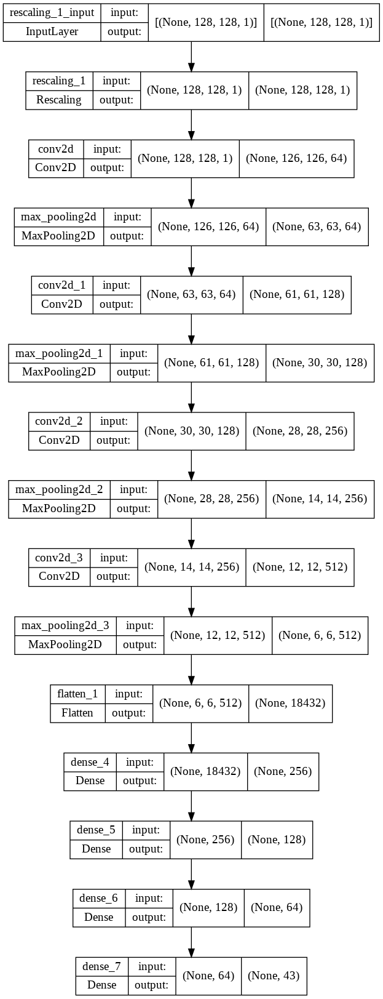

In [118]:
# Display internal structure of layers and nodes

SVG(model_to_dot(cnn_model).create(prog='dot', format='svg'))
plot_model(cnn_model, to_file='model_plot.png', show_shapes=True, show_layer_names=True, expand_nested=True)

Plot model `accuracy` vs `epoch`.

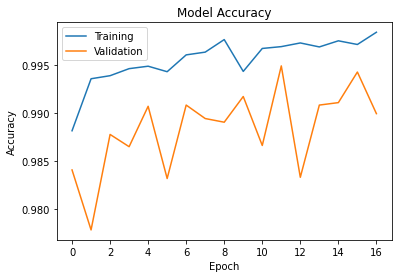

In [119]:
plt.title('Model Accuracy')

plt.xlabel('Epoch')
plt.ylabel('Accuracy')

plt.plot(cnn_history.history['accuracy'])
plt.plot(cnn_history.history['val_accuracy'])

plt.legend(['Training', 'Validation'])

plt.show()

Plot model `loss` vs `epoch`.

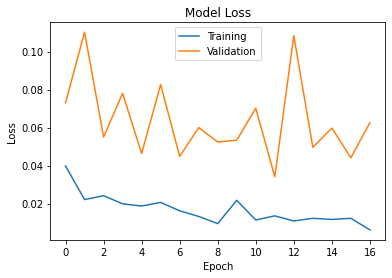

In [120]:
plt.title('Model Loss')

plt.xlabel('Epoch')
plt.ylabel('Loss')

plt.plot(cnn_history.history['loss'])
plt.plot(cnn_history.history['val_loss'])

plt.legend(['Training', 'Validation'])

plt.show()

Evaluate the model.


In [121]:
cnn_results = cnn_model.evaluate(test_dataset)

395/395 [==============================] - 13s 31ms/step - loss: 0.1923 - accuracy: 0.9696


Save the model.


In [122]:
cnn_model.save('cnn_model.h5')

## Transfer learning

In [123]:
import os
import tensorflow as tf
import sklearn as sk
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [124]:
!rm -rf /root/.keras/datasets/GTSRB/Final_Training/Images/


In [125]:
!rm -rf /root/.keras/datasets/GTSRB/Final_Test/Images/

In [126]:
# Import Training dataset
training_images_zip = tf.keras.utils.get_file(
    fname='training_images.zip',
    origin='https://sid.erda.dk/public/archives/daaeac0d7ce1152aea9b61d9f1e19370/GTSRB_Final_Training_Images.zip',
    extract=True,
    archive_format='zip'
    
)
training_images_dir = '/root/.keras/datasets/GTSRB/Final_Training/Images/'

In [127]:
# os.listdir('/root/.keras/datasets/GTSRB/Final_Training/Images/')

In [128]:
# Import Test dataset
test_images_zip = tf.keras.utils.get_file(
    fname='test_images.zip',
    origin='https://sid.erda.dk/public/archives/daaeac0d7ce1152aea9b61d9f1e19370/GTSRB_Final_Test_Images.zip',
    extract=True,
    archive_format='zip'   
)
test_images_dir = '/root/.keras/datasets/GTSRB/Final_Test/Images/'

In [129]:
test_images_csv_zip = tf.keras.utils.get_file(
    fname='test_images_csv.zip',
    origin='https://sid.erda.dk/public/archives/daaeac0d7ce1152aea9b61d9f1e19370/GTSRB_Final_Test_GT.zip',
    extract=True,
    archive_format='zip'
)
test_images_csv = '/root/.keras/datasets/GT-final_test.csv'
test_images_metadata = pd.read_csv(test_images_csv, sep=';')

def restructure_directory(directory, metadata):
  for dirpath, _, filenames in os.walk(directory):
    for filename in filenames:
      if filename.endswith('.ppm'):
        filename, _ = filename.split('.')

        id = int(metadata.loc[metadata.Filename == f'{filename}.ppm'].ClassId)
        directory = f'{dirpath}{id:05}'

        if not os.path.isdir(directory): os.mkdir(directory)
        
        os.rename(f'{dirpath}{filename}.ppm', f'{directory}/{filename}.ppm')

restructure_directory(test_images_dir, test_images_metadata)        

In [130]:
train_datagen = ImageDataGenerator(rescale = 1.0/255., rotation_range=10,
      width_shift_range=0.1,
      height_shift_range=0.1,
      shear_range=0.1,
      zoom_range=0.1,
      horizontal_flip=True,
      validation_split=0.2,
      fill_mode='nearest')


In [131]:
test_datagen = ImageDataGenerator( rescale = 1.0/255. )


In [132]:
# Flow training images in batches of 20 using train_datagen generator
train_generator = train_datagen.flow_from_directory(training_images_dir,
                                                    batch_size = 32,
                                                    class_mode = 'categorical', 
                                                    target_size = (150, 150), 
                                                    subset="training") 
    
validation_generator = train_datagen.flow_from_directory(training_images_dir,
                                                    batch_size = 32,
                                                    class_mode = 'categorical', 
                                                    target_size = (150, 150), 
                                                    subset="validation")
# Flow validation images in batches of 20 using test_datagen generator
test_generator =  test_datagen.flow_from_directory(test_images_dir,
                                                          batch_size  = 32,
                                                          class_mode  = 'categorical', 
                                                          target_size = (150, 150))


Found 31368 images belonging to 43 classes.
Found 7841 images belonging to 43 classes.
Found 12630 images belonging to 43 classes.


In [133]:
from tensorflow.keras import layers
from tensorflow.keras import Model
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5 \
    -O /tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5
  
from tensorflow.keras.applications.inception_v3 import InceptionV3

local_weights_file = '/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5'

pre_trained_model = InceptionV3(input_shape = (150, 150, 3), 
                                include_top = False, 
                                weights = None)

pre_trained_model.load_weights(local_weights_file)

for layer in pre_trained_model.layers:
  layer.trainable = False
  
pre_trained_model.summary()

--2022-04-20 13:23:05--  https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.132.128, 74.125.69.128, 173.194.193.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.132.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 87910968 (84M) [application/x-hdf]
Saving to: ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’

/tmp/inception_v3_w 100%[===================>]  83.84M  74.2MB/s    in 1.1s    

2022-04-20 13:23:06 (74.2 MB/s) - ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’ saved [87910968/87910968]

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 150, 150, 3  0           []    

In [134]:
last_layer = pre_trained_model.get_layer('mixed7')
print('last layer output shape: ', last_layer.output_shape)
last_output = last_layer.output

last layer output shape:  (None, 7, 7, 768)


In [135]:
from tensorflow.keras.optimizers import RMSprop

# Flatten the output layer to 1 dimension
x = layers.Flatten()(last_output)
# Add a fully connected layer with 1,024 hidden units and ReLU activation
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.3)(x) 
# Add a second dense layer with fewer nodes
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)                  
# Add a third dense layer with fewer nodes
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.3)(x)          
x = layers.Dense  (43, activation='softmax')(x)           

tl_model = Model( pre_trained_model.input, x) 

tl_model.compile(#optimizer = RMSprop(lr=0.0001), 
              optimizer = keras.optimizers.SGD(lr=0.01, momentum=0.9, decay=0.01),
              loss = 'categorical_crossentropy', 
              metrics = ['accuracy'])

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/gradient_descent.py:102: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(SGD, self).__init__(name, **kwargs)


In [136]:
callbacks = [
  tf.keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True)
]

In [137]:
batch_size=32
history = tl_model.fit(
            train_generator,
            validation_data = validation_generator,
            steps_per_epoch = train_generator.samples/batch_size,
            epochs = 40,
            callbacks= callbacks,
            validation_steps = 50)

Epoch 1/40
980/980 [==============================] - 232s 231ms/step - loss: 1.5294 - accuracy: 0.5229 - val_loss: 0.9942 - val_accuracy: 0.6581
Epoch 2/40
980/980 [==============================] - 224s 229ms/step - loss: 0.8951 - accuracy: 0.6986 - val_loss: 0.8656 - val_accuracy: 0.7038
Epoch 3/40
980/980 [==============================] - 219s 223ms/step - loss: 0.7410 - accuracy: 0.7508 - val_loss: 0.7680 - val_accuracy: 0.7437
Epoch 4/40
980/980 [==============================] - 219s 223ms/step - loss: 0.6565 - accuracy: 0.7767 - val_loss: 0.7652 - val_accuracy: 0.7406
Epoch 5/40
980/980 [==============================] - 218s 223ms/step - loss: 0.6105 - accuracy: 0.7924 - val_loss: 0.7103 - val_accuracy: 0.7613
Epoch 6/40
980/980 [==============================] - 225s 230ms/step - loss: 0.5759 - accuracy: 0.8063 - val_loss: 0.7129 - val_accuracy: 0.7525
Epoch 7/40
980/980 [==============================] - 225s 230ms/step - loss: 0.5438 - accuracy: 0.8184 - val_loss: 0.6052 -

In [138]:
tl_results = tl_model.evaluate(test_generator)

395/395 [==============================] - 29s 74ms/step - loss: 0.5066 - accuracy: 0.8306


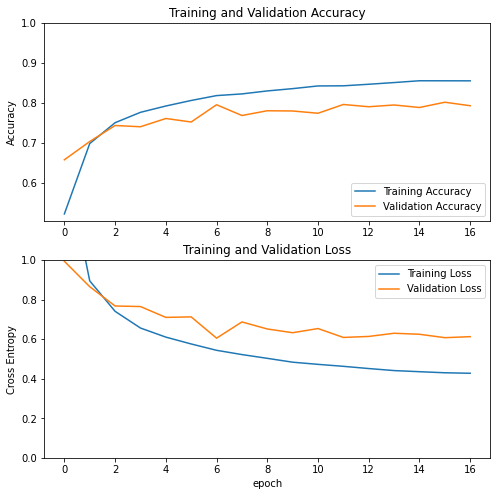

In [139]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

## Results

## Notes

https://www.tensorflow.org/tutorials/keras/classification